## Merge file 

In [27]:
import csv
import pandas as pd 

# Generate filenames programmatically

path = "/Volumes/T9/XGBoost_OD_TBBE/XGBoostTBBE/100simOGCompare1000mData/"  # using XGB2_model
files = [path + "new_final_balance_{}.csv".format(i) for i in range(100)]

merged_filename = "/Volumes/T9/XGBoost_OD_TBBE/XGBoostTraining/StatTestOGCompare1000m/100simStat_merge_result.csv"

with open(merged_filename, 'w', newline='') as outfile:
    writer = csv.writer(outfile)
    
    for index, filename in enumerate(files):
        with open(filename, 'r') as infile:
            reader = csv.reader(infile)
            
            # Skip header only if it's not the first file
            if index != 0:
                next(reader, None)
                
            # Write rows from current file to the output file
            writer.writerows(reader)

## Find average of each betting agents. 

In [2]:
import pandas as pd

# Read the data
df = pd.read_csv(
    "/Volumes/T9/XGBoost_OD_TBBE/XGBoostTraining/StatTestOGCompare1000m/100simStat_merge_result.csv",
    header=None,
)

# Drop the header row
df = df.drop(0)

# Convert all values to float
df = df.astype(float)

# Define ranges for mapping => to group agents with same type/category
ranges = [ 
    (0, 10, 1),
    (10, 20, 2),
    (20, 30, 3),
    (30, 40, 4),
    (40, 50, 5),
    (50, 55, 6),
    (55, 60, 7),
    (60, 65, 8),
    (65, 70, 9),
]

# Create a mapping function based on ranges
def get_mapping(col):
    for start, end, category in ranges:
        if start <= col < end:
            return category

# Create a new DataFrame with mapped columns
mapped_df = df.copy()
mapped_df.columns = [get_mapping(col) for col in df.columns]

# Group by column categories and compute the mean
averaged_df = mapped_df.groupby(mapped_df.columns, axis=1).mean()
averaged_df = averaged_df - 100000000

print(averaged_df)

              1            2          3           4          5            6  \
1   -994.685525   847.829955 -28.089137  -97.943030  58.536487  5665.630067   
2    809.134944  -472.500000  16.500000  -53.559270  17.796795  2772.056342   
3   -135.000000 -1222.618359 -22.500000  -52.988672   8.210156 -2978.800781   
4   -262.995385   533.693532 -53.170613   67.255344  32.602960 -1492.832128   
5    156.603882   -57.495204  -9.294508 -278.405334  95.418994  -128.933526   
..          ...          ...        ...         ...        ...          ...   
96   608.965652  -284.795633 -21.251437   31.954312  30.463359 -6466.407857   
97  -195.427122   301.336323 -74.906713    9.463007  69.666042  -581.479806   
98   109.672023 -1989.000000   4.500000    9.322178  26.550000 -2296.314176   
99  -195.174633 -3342.000000  60.671096 -133.500000   3.000000  1959.727012   
100 -480.789120  -785.804356 -63.994284 -303.000000  76.532826  1650.330982   

               7            8            9  
1   -2

/var/folders/56/1wgtsx053h5_2lvs_fqprbsw0000gn/T/ipykernel_11120/3073578640.py:39: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  averaged_df = mapped_df.groupby(mapped_df.columns, axis=1).mean()


In [3]:
import pandas as pd

# Read the data
df = pd.read_csv(
    "/Volumes/T9/XGBoost_OD_TBBE/XGBoostTraining/StatTestOGCompare1000m/100simStat_merge_result.csv",
    header=None,
)
# Drop the header row
df = df.drop(0)

# Convert all values to float
df = df.astype(float)

# Define ranges for mapping => to group agents with same type/category
ranges = [
    (0, 10, 1),
    (10, 20, 2),
    (20, 30, 3),
    (30, 40, 4),
    (40, 50, 5),
    (50, 55, 6),
    (55, 60, 7),
    (60, 65, 8),
    (65, 70, 9),
]


# Create a mapping function based on ranges
def get_mapping(col):
    for start, end, category in ranges:
        if start <= col < end:
            return category


# Create a new DataFrame with mapped columns
mapped_df = df.copy()
mapped_df.columns = [get_mapping(col) for col in df.columns]

# Group by column categories and compute the mean
averaged_df = mapped_df.groupby(mapped_df.columns, axis=1).mean()
averaged_df = averaged_df - 100000000

# Print the total averaged balance for XGBoost1 and XGBoost2
xgboostOG_total_balance = averaged_df.iloc[:, 6].sum()
xgboostRep_total_balance = averaged_df.iloc[:, 7].sum()
xgboost1_total_balance = averaged_df.iloc[:, 8].sum()

print("Total Averaged Balance for XGBoostOG:", xgboostOG_total_balance)
print("Total Averaged Balance for XGBoostRep:", xgboostRep_total_balance)
print("Total Averaged Balance for XGBoost1:", xgboost1_total_balance)

Total Averaged Balance for XGBoostOG: 36247.47648820281
Total Averaged Balance for XGBoostRep: 19274.20302578807
Total Averaged Balance for XGBoost1: 59831.789325773716


/var/folders/56/1wgtsx053h5_2lvs_fqprbsw0000gn/T/ipykernel_11120/2206965037.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  averaged_df = mapped_df.groupby(mapped_df.columns, axis=1).mean()


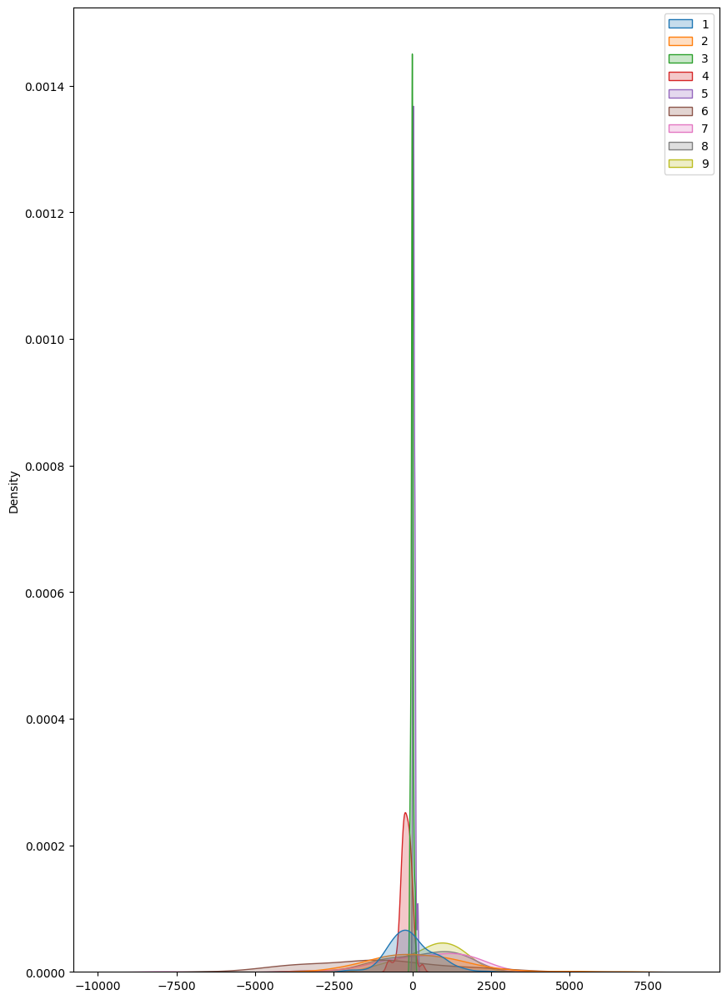

In [4]:
import seaborn as sns 
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 15))
distributionPlot = sns.kdeplot(data=averaged_df,fill=True)
plt.show()


## Statistical Testing

In [5]:
from scipy import stats

# Last two agents
xgboostOG_avg_balance = averaged_df.iloc[:, -3]  # third last column
xgboostRep_avg_balance = averaged_df.iloc[:, -2]  # second column
xgboost1_avg_balance = averaged_df.iloc[:, -1]  # Last column

# List to hold the two agents
agents = [xgboostOG_avg_balance, xgboostRep_avg_balance, xgboost1_avg_balance]

# Loop through the agent
for agent in agents:
    # Loop through columns 1 to third last for other agents
    for col_index in range(averaged_df.shape[1] - 3):
        other_agent_balance = averaged_df.iloc[:, col_index]
        # Check normality for both columns
        _, pvalue_agent = stats.shapiro(agent)
        _, pvalue_other_agent = stats.shapiro(other_agent_balance)
        print("P_value_agent", pvalue_agent)
        print("pvalue_other_agent ", pvalue_other_agent)
        # If both are normally distributed
        if pvalue_agent > 0.05 and pvalue_other_agent > 0.05:
            print("normal")
            statistic, pvalue = stats.ttest_rel(agent, other_agent_balance)
            if pvalue < 0.05:
                print("There is a statistically significant difference")
            else:
                print("There isn't a statistically significant difference")
        else:
            print("not normal")
            # If either or both are not normally distributed
            statistic, pvalue = stats.wilcoxon(agent, other_agent_balance)
            if pvalue < 0.05:
                print("There is a statistically significant difference")
                print("P-Value", pvalue)
                print("")
            else:
                print("There isn't a statistically significant difference")

P_value_agent 1.619919581736182e-07
pvalue_other_agent  0.05281566905392371
not normal
There is a statistically significant difference
P-Value 0.0010374753182760608

P_value_agent 1.619919581736182e-07
pvalue_other_agent  0.00045680095259250503
not normal
There isn't a statistically significant difference
P_value_agent 1.619919581736182e-07
pvalue_other_agent  0.004694742723332053
not normal
There is a statistically significant difference
P-Value 0.0006003677894692835

P_value_agent 1.619919581736182e-07
pvalue_other_agent  0.0015676633796593493
not normal
There is a statistically significant difference
P-Value 1.6976498032482443e-05

P_value_agent 1.619919581736182e-07
pvalue_other_agent  4.2187921758699996e-07
not normal
There is a statistically significant difference
P-Value 0.002342965676631893

P_value_agent 1.619919581736182e-07
pvalue_other_agent  0.5018121552779776
not normal
There is a statistically significant difference
P-Value 7.2228356931968e-06

P_value_agent 2.7980040877

# Stat test with plotting

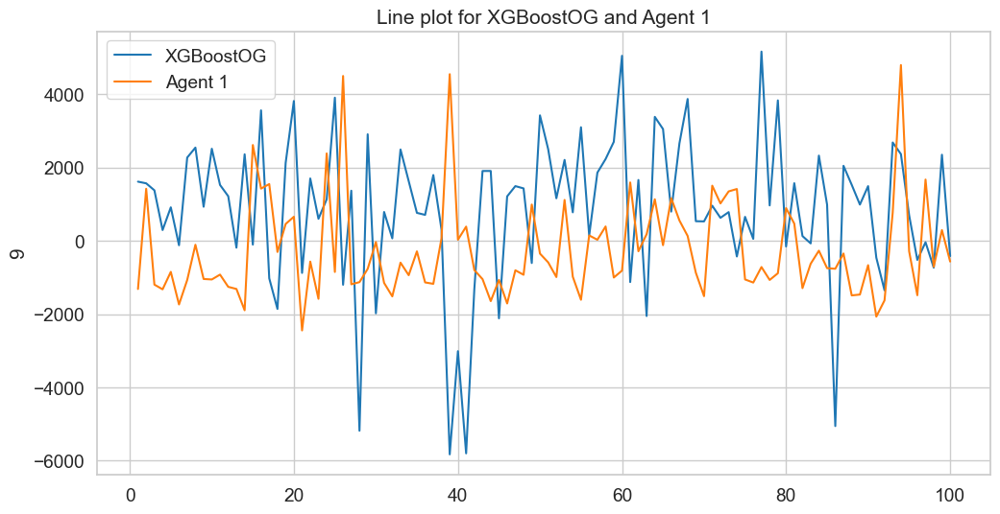

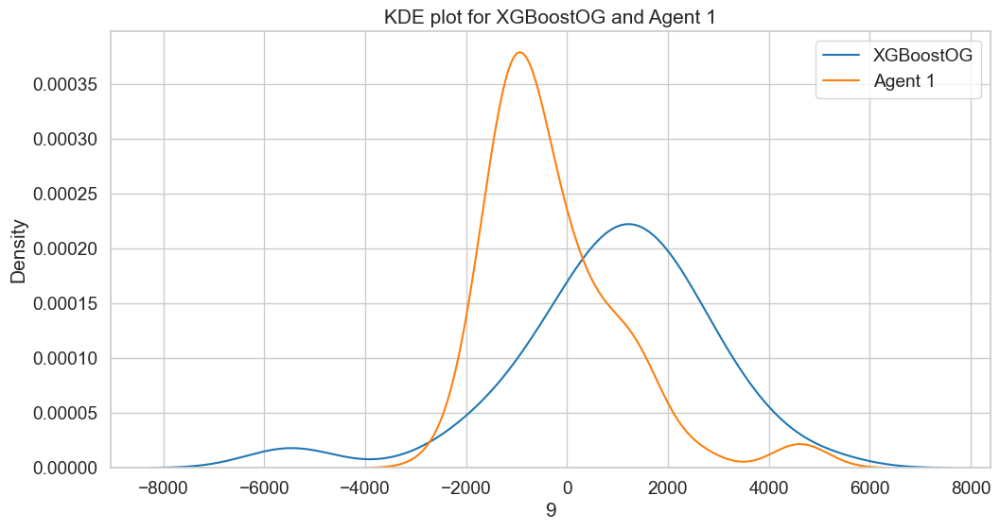

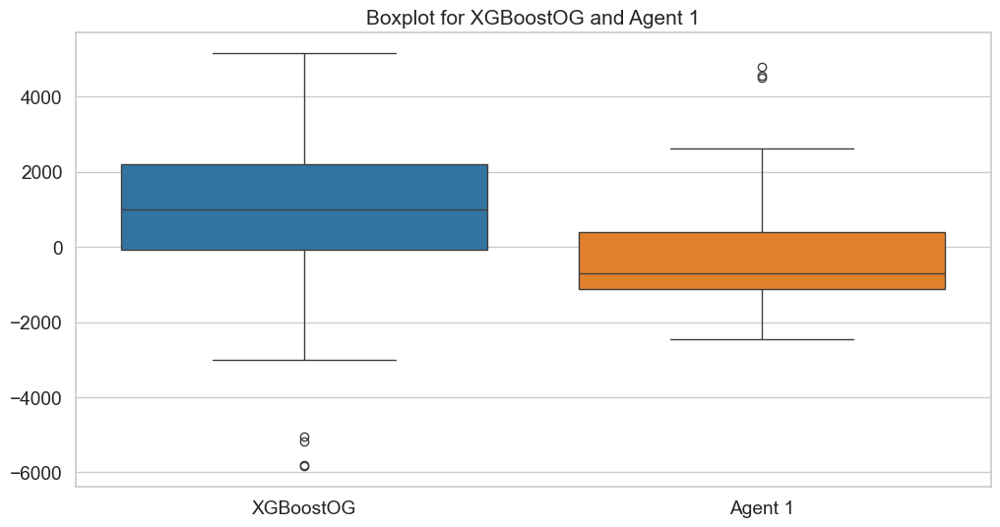

P_value_XGBoostOG 7.40869187453485e-05
pvalue_other_agent  3.861357709350255e-08
not normal
There is a statistically significant difference
P-Value 6.753578546145334e-09



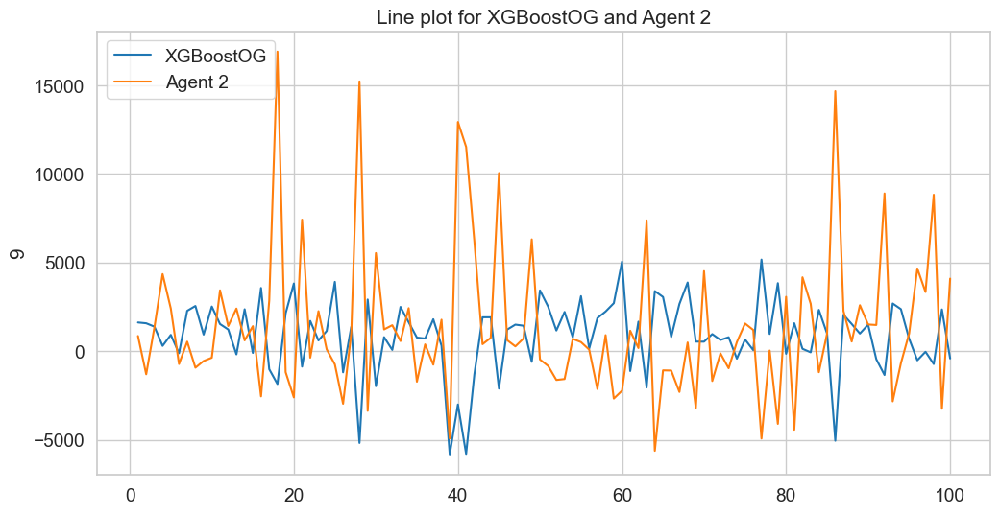

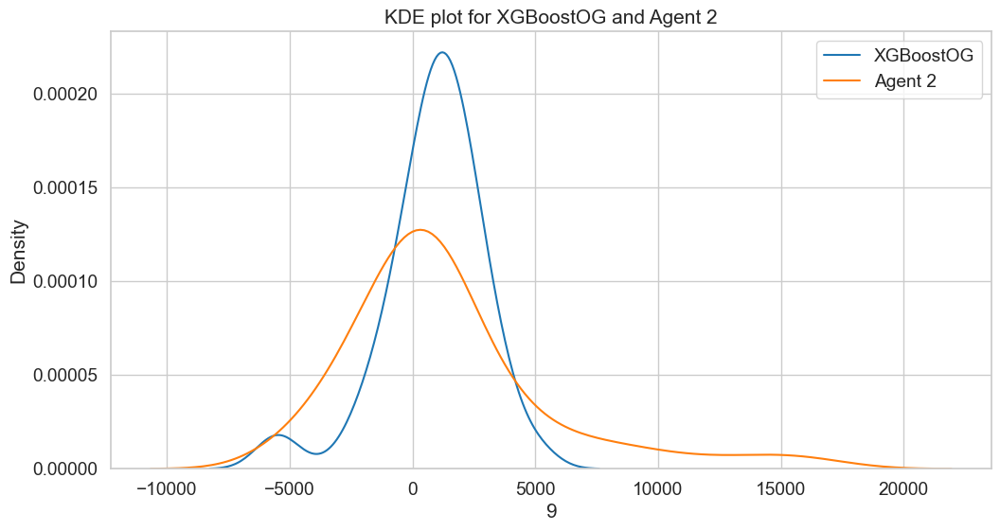

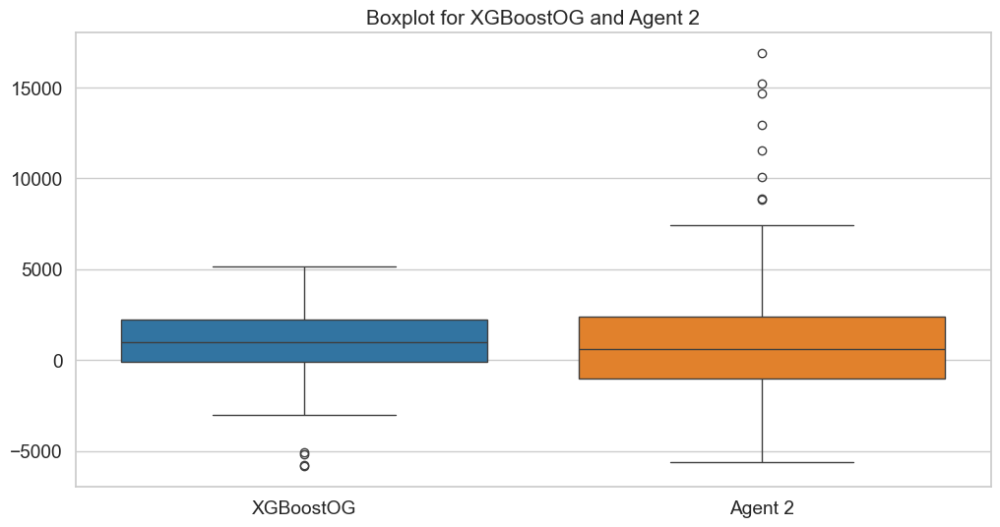

P_value_XGBoostOG 7.40869187453485e-05
pvalue_other_agent  4.711992036072101e-08
not normal
There isn't a statistically significant difference


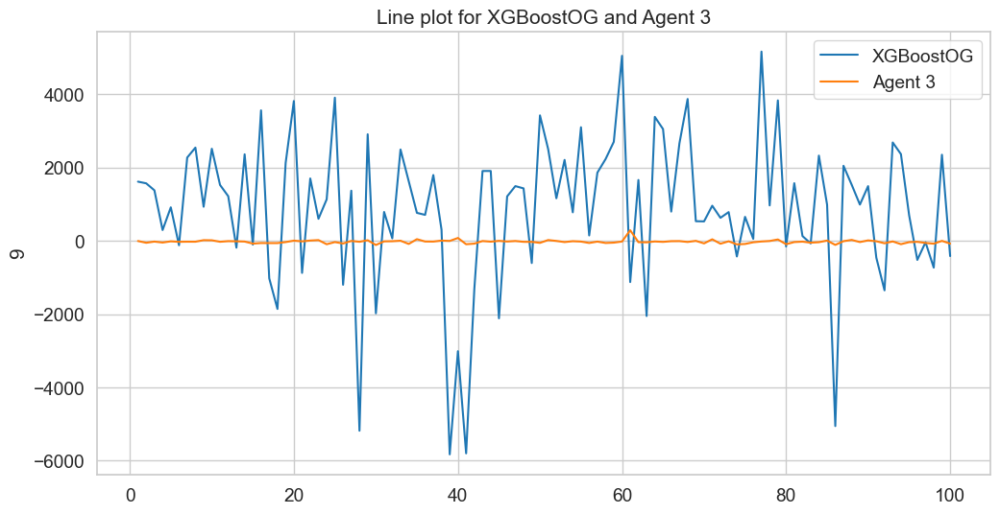

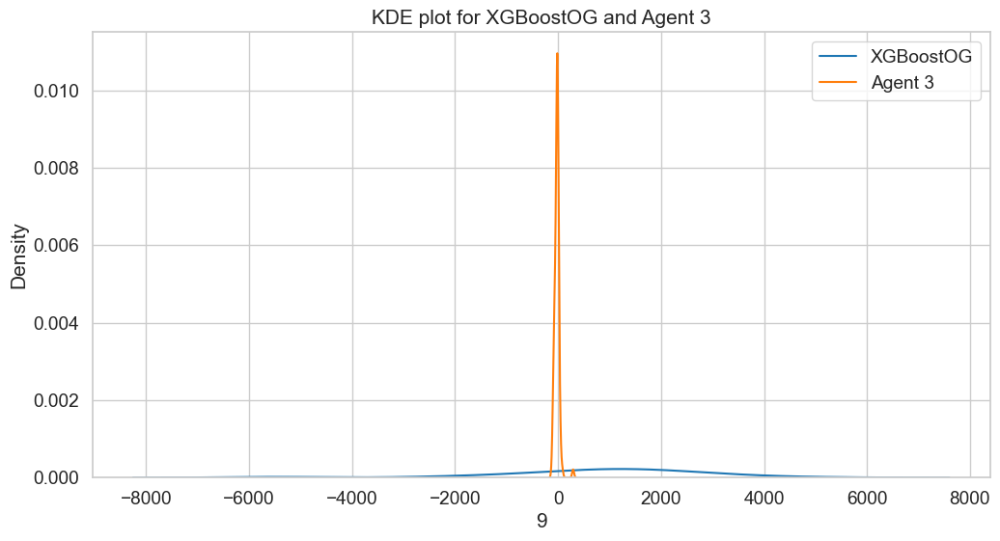

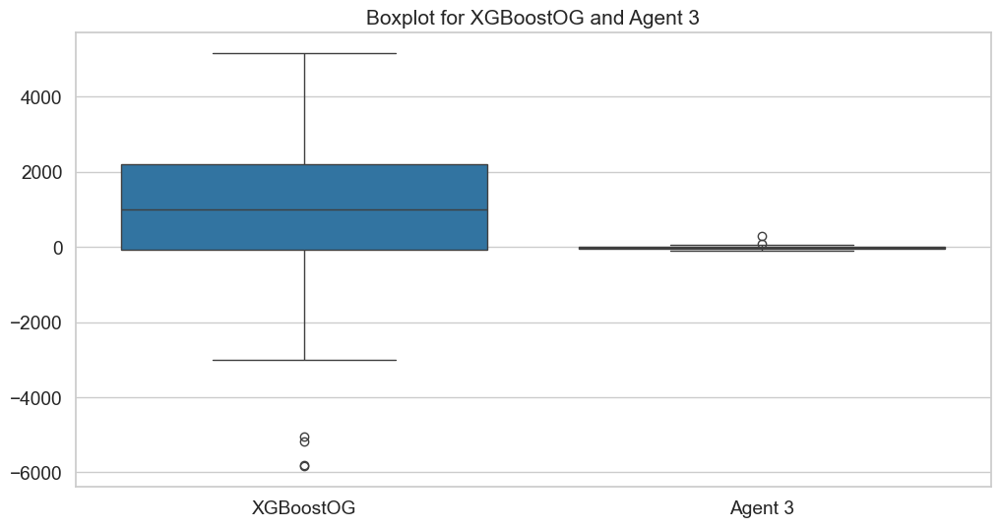

P_value_XGBoostOG 7.40869187453485e-05
pvalue_other_agent  1.7379104175721235e-10
not normal
There is a statistically significant difference
P-Value 1.0730676753162289e-08



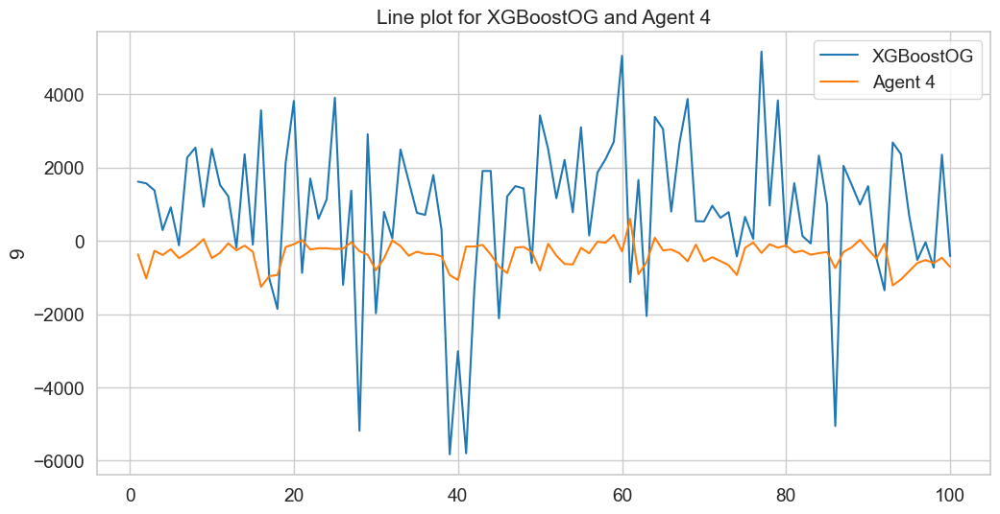

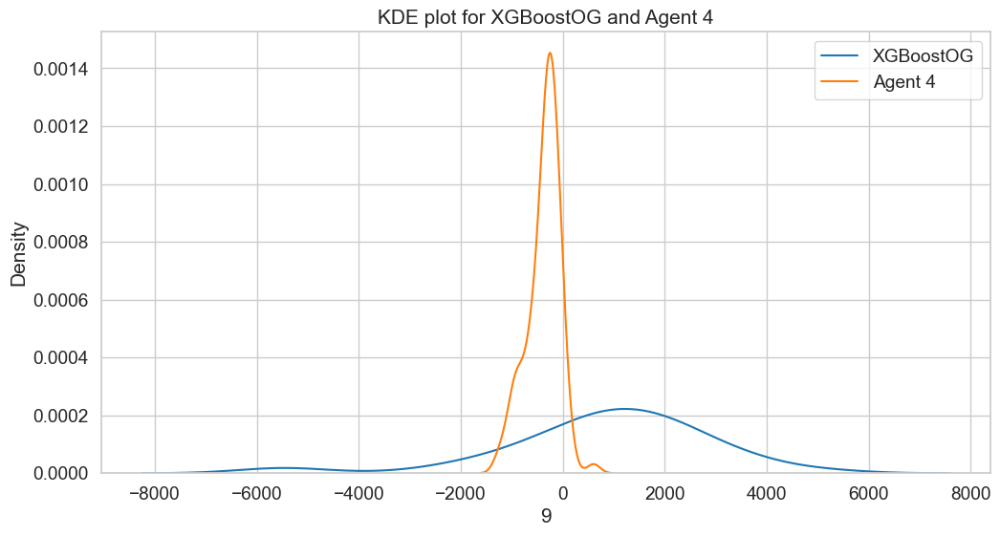

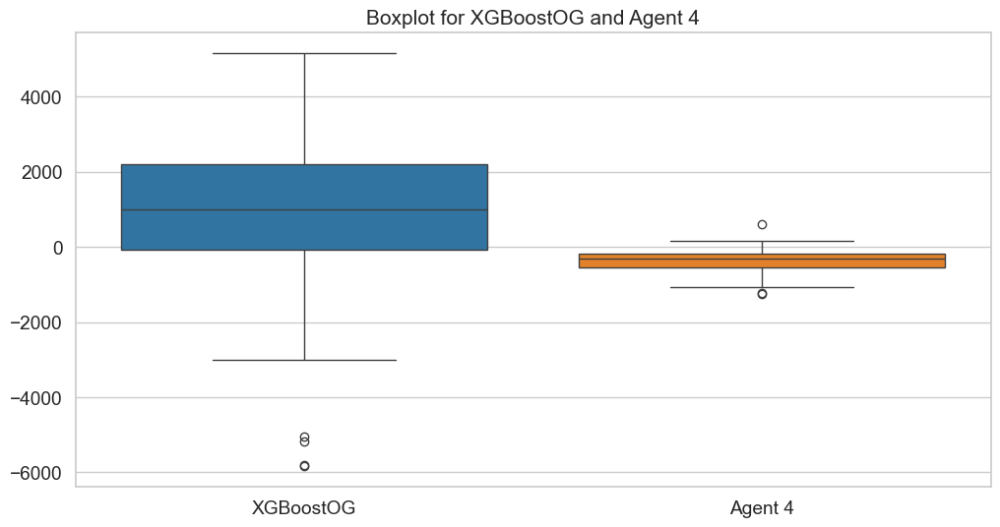

P_value_XGBoostOG 7.40869187453485e-05
pvalue_other_agent  0.0009267008807645834
not normal
There is a statistically significant difference
P-Value 4.4544435160501645e-13



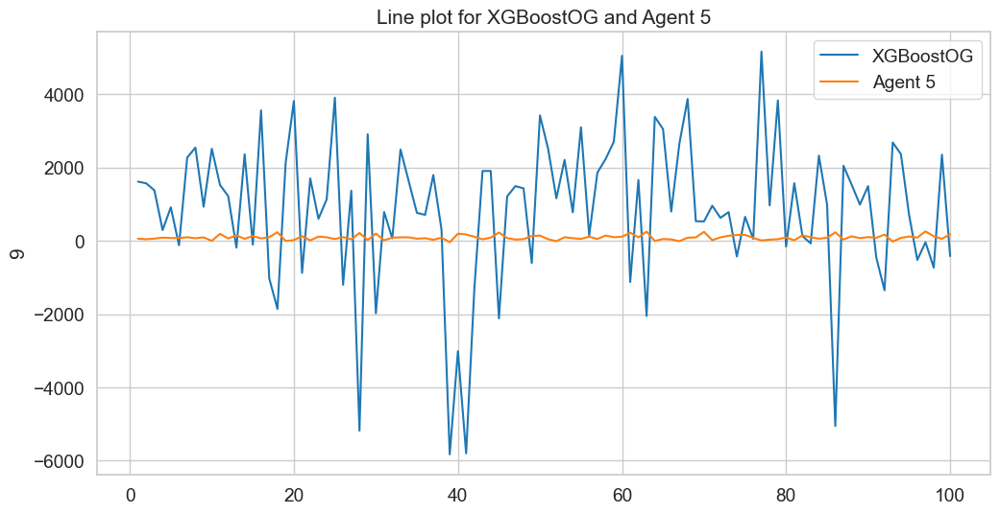

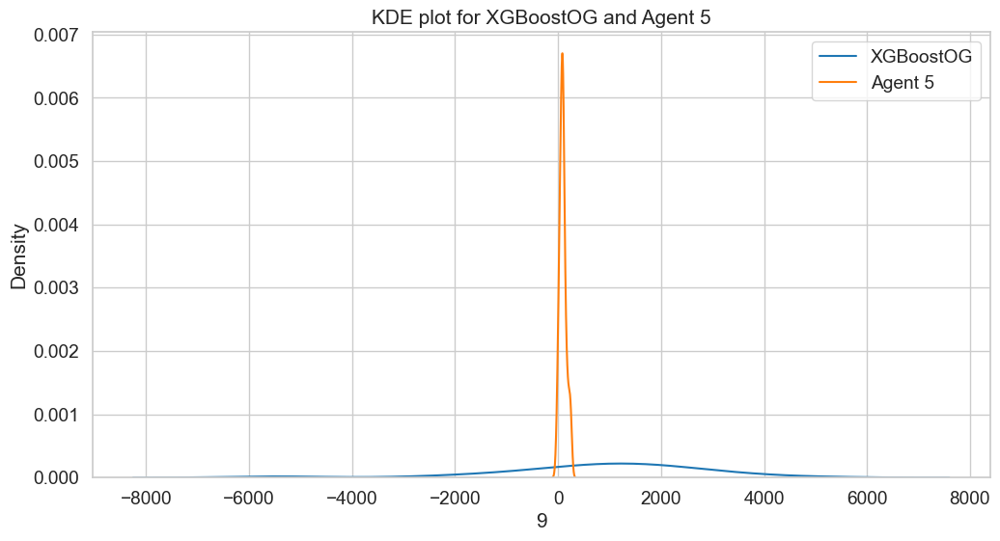

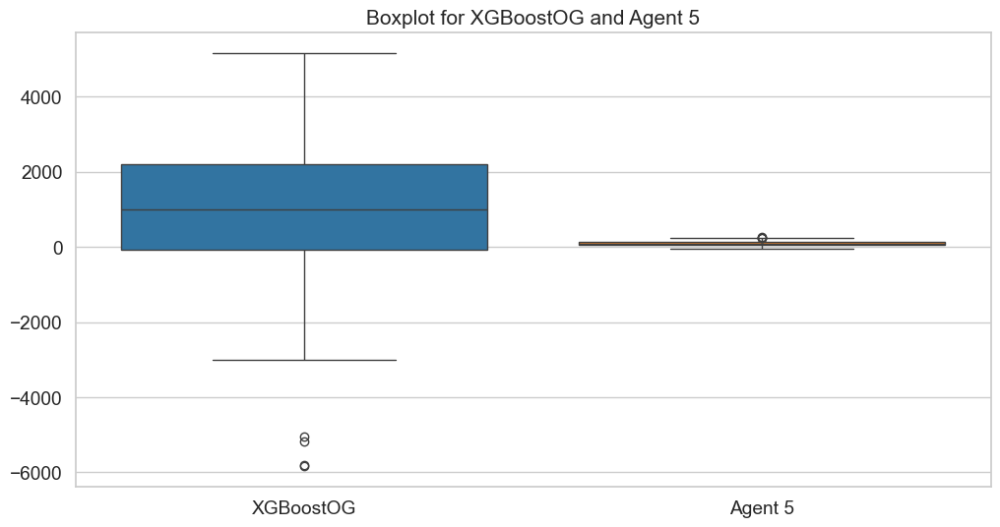

P_value_XGBoostOG 7.40869187453485e-05
pvalue_other_agent  0.0037123767583105544
not normal
There is a statistically significant difference
P-Value 2.0919044541043978e-07



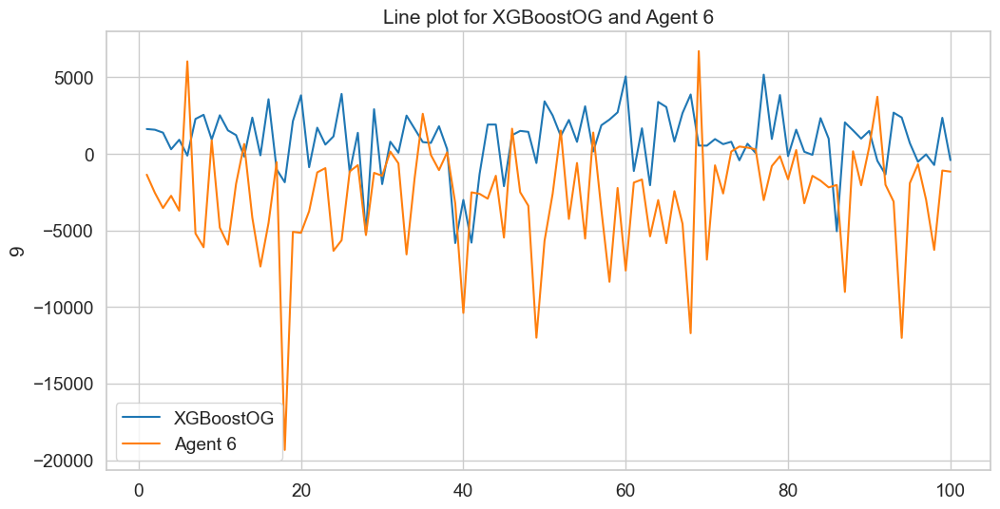

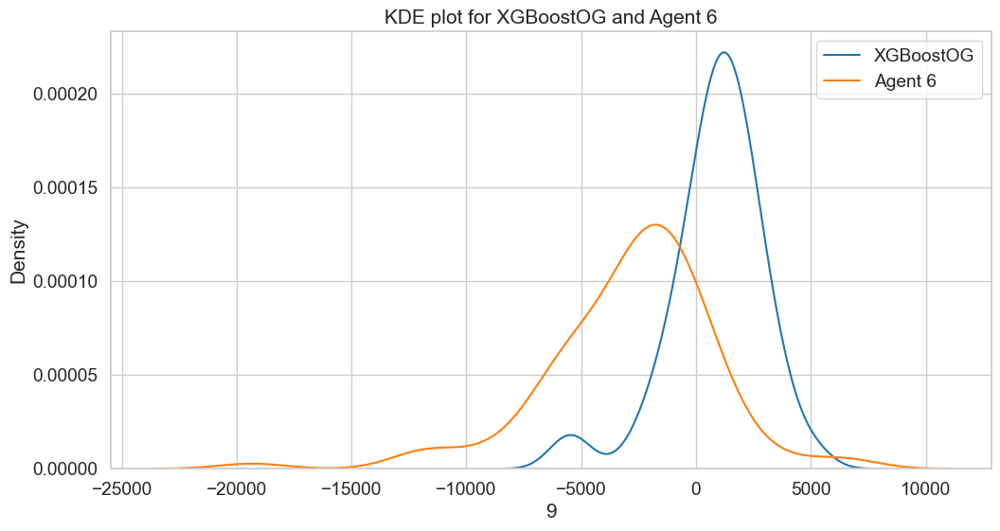

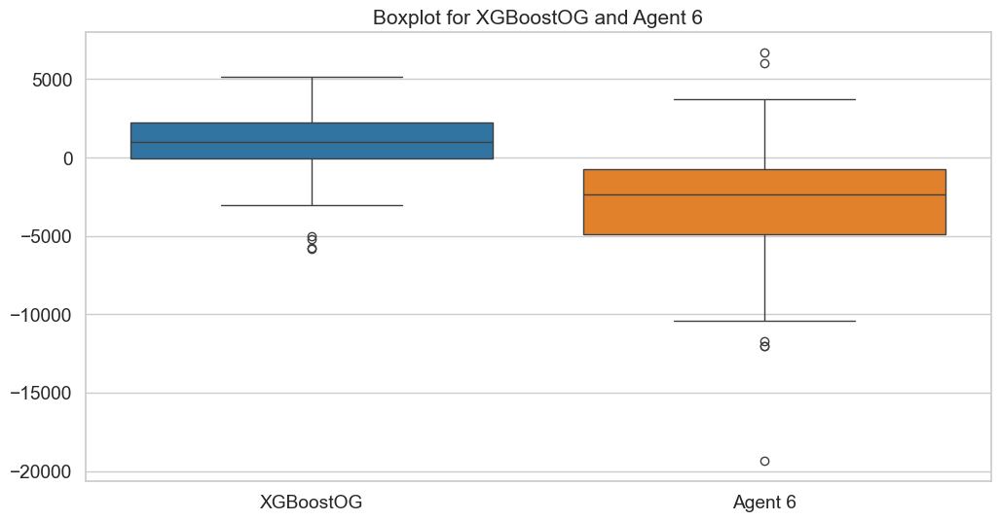

P_value_XGBoostOG 7.40869187453485e-05
pvalue_other_agent  2.396108617568023e-05
not normal
There is a statistically significant difference
P-Value 2.460526346907824e-18



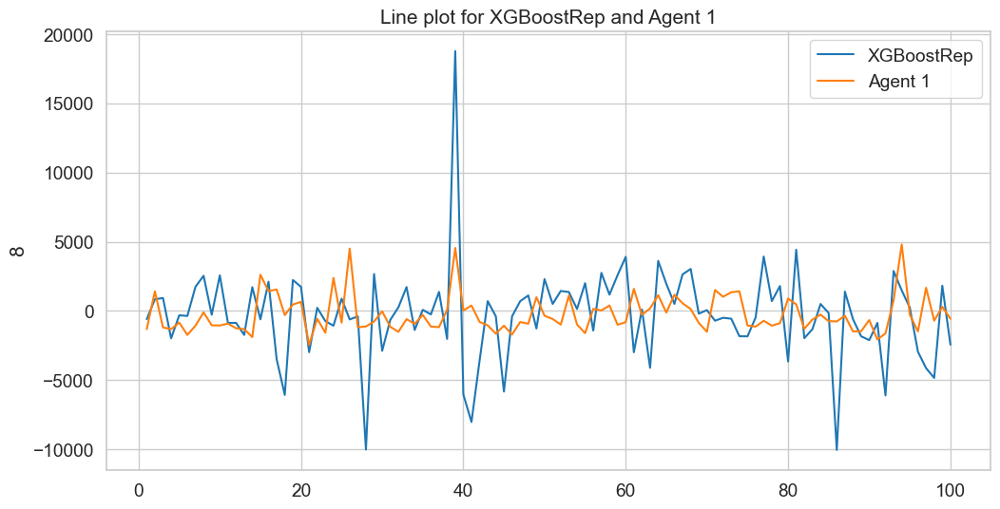

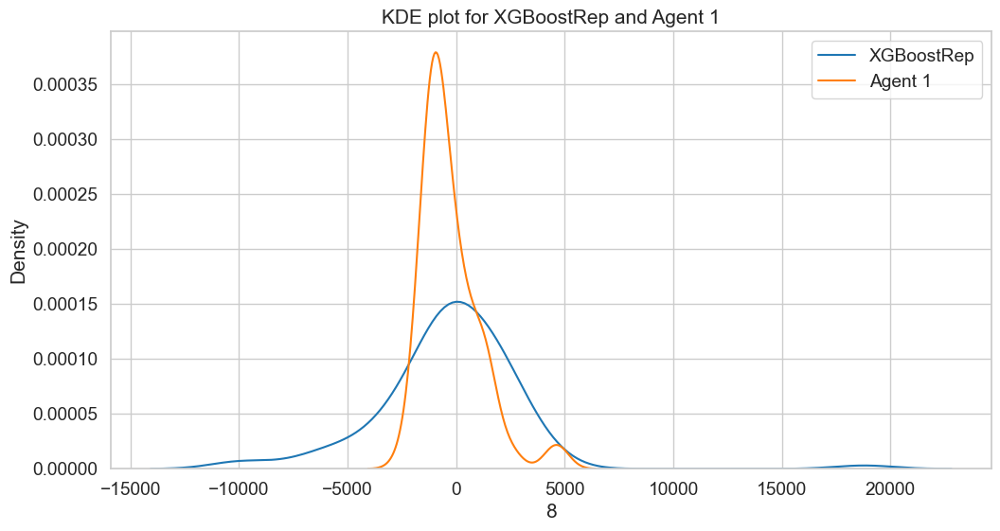

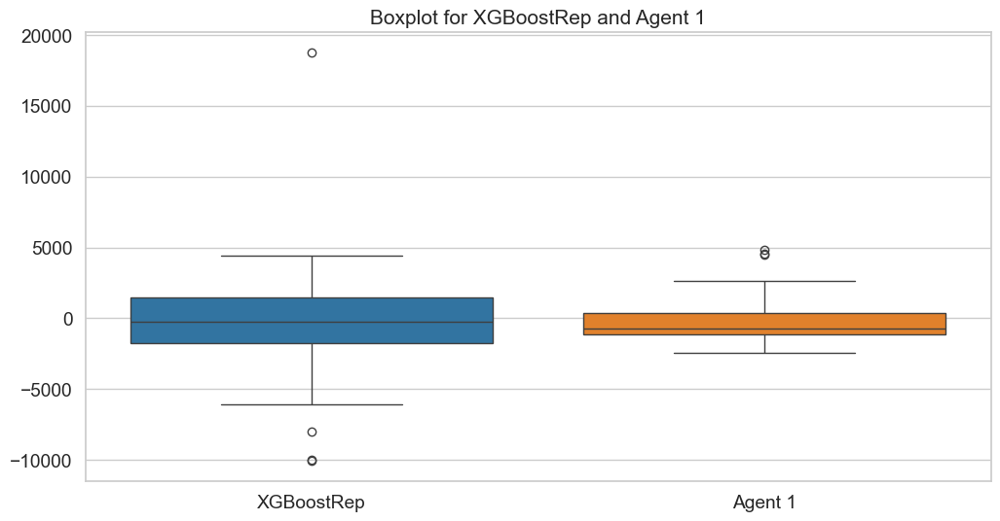

P_value_XGBoostRep 8.48212736918389e-09
pvalue_other_agent  3.861357709350255e-08
not normal
There isn't a statistically significant difference


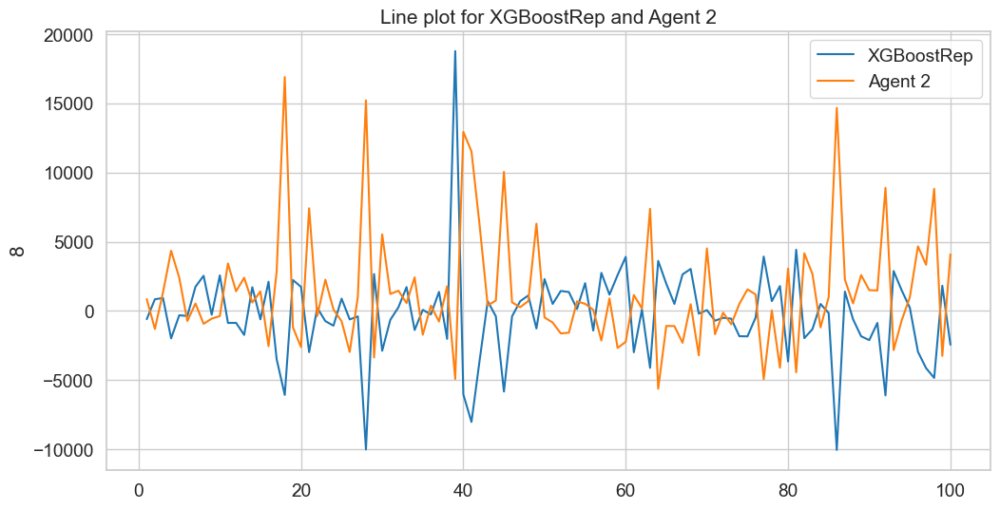

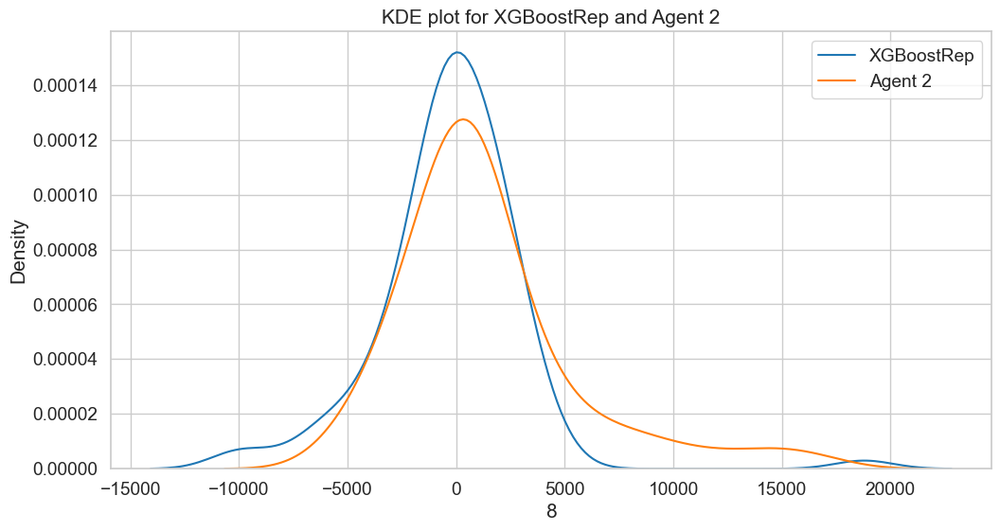

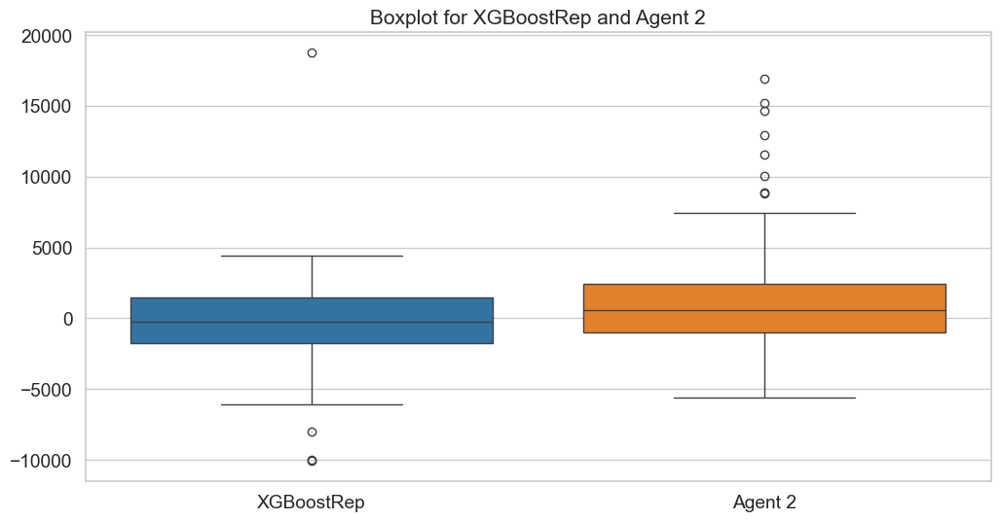

P_value_XGBoostRep 8.48212736918389e-09
pvalue_other_agent  4.711992036072101e-08
not normal
There is a statistically significant difference
P-Value 0.019181318874843954



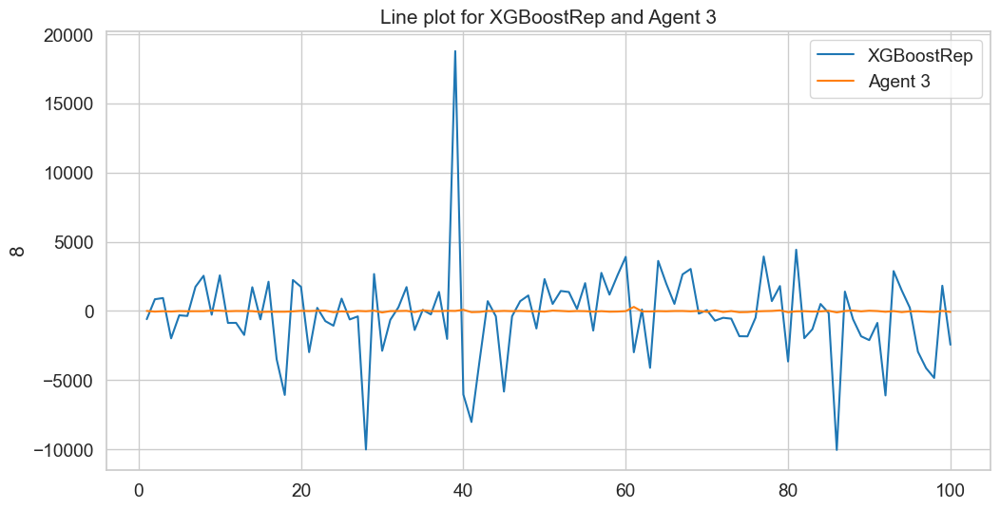

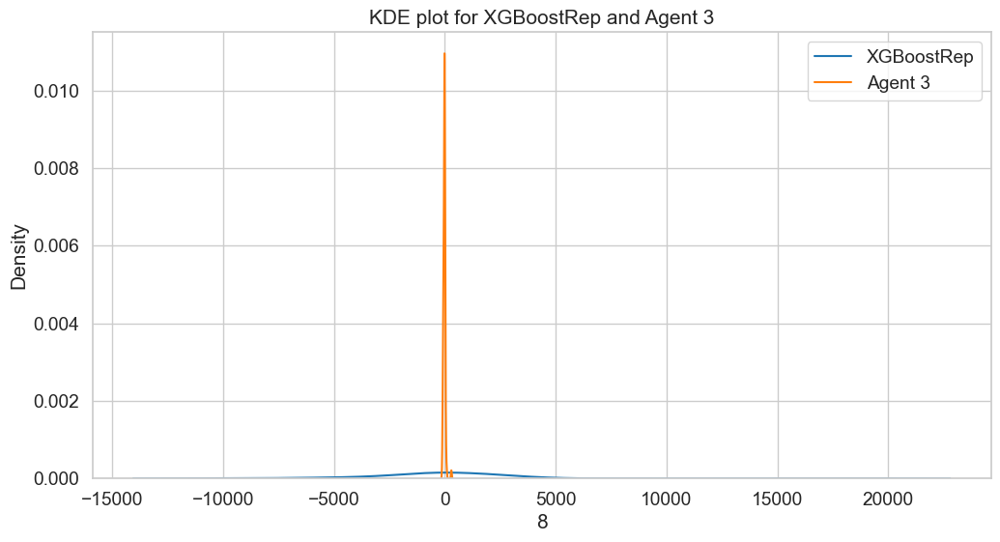

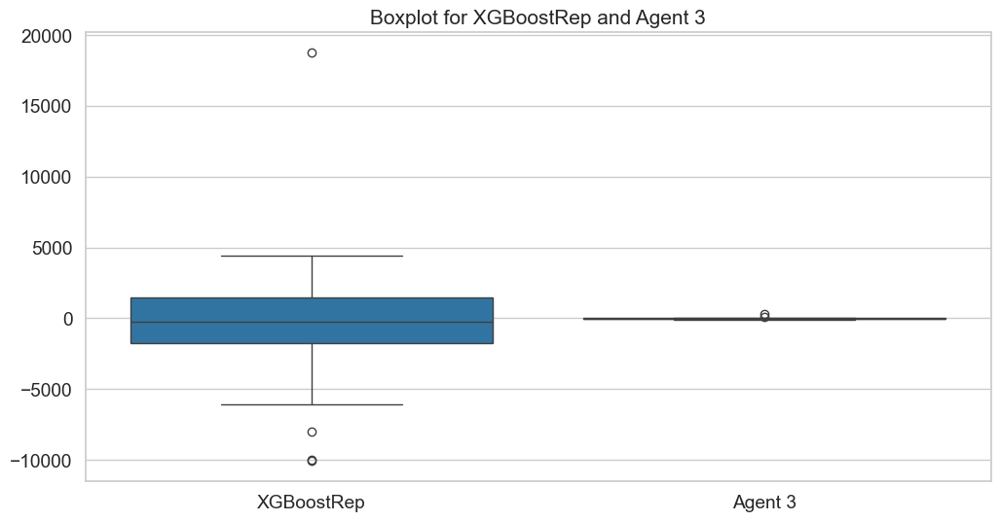

P_value_XGBoostRep 8.48212736918389e-09
pvalue_other_agent  1.7379104175721235e-10
not normal
There isn't a statistically significant difference


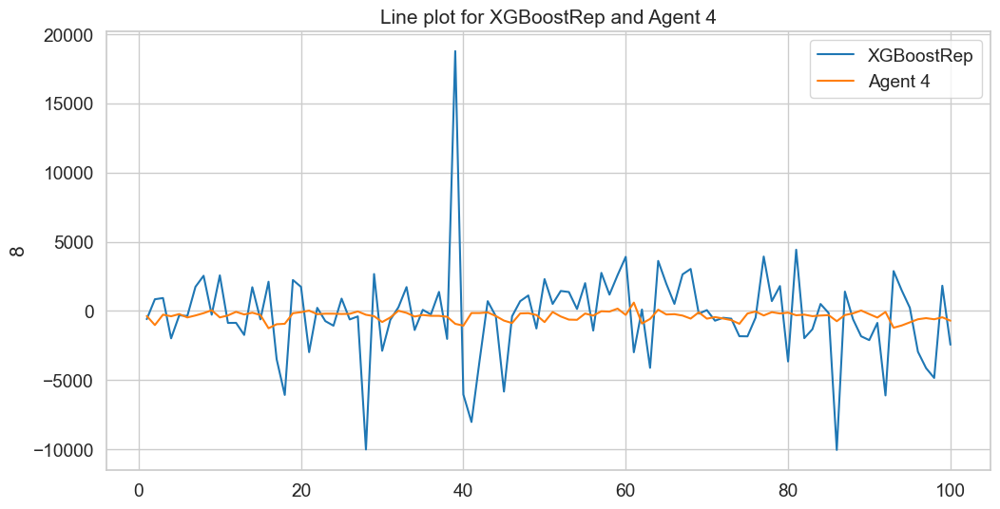

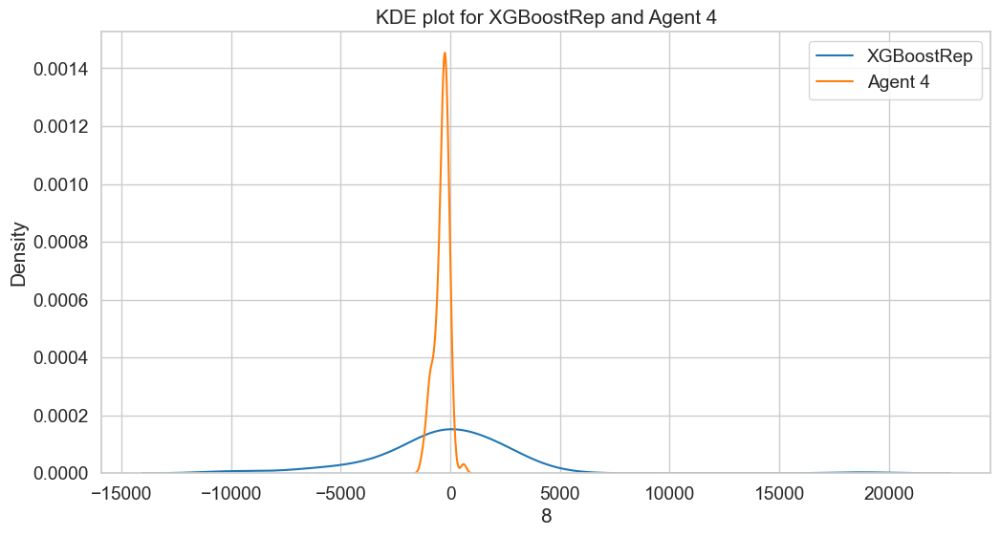

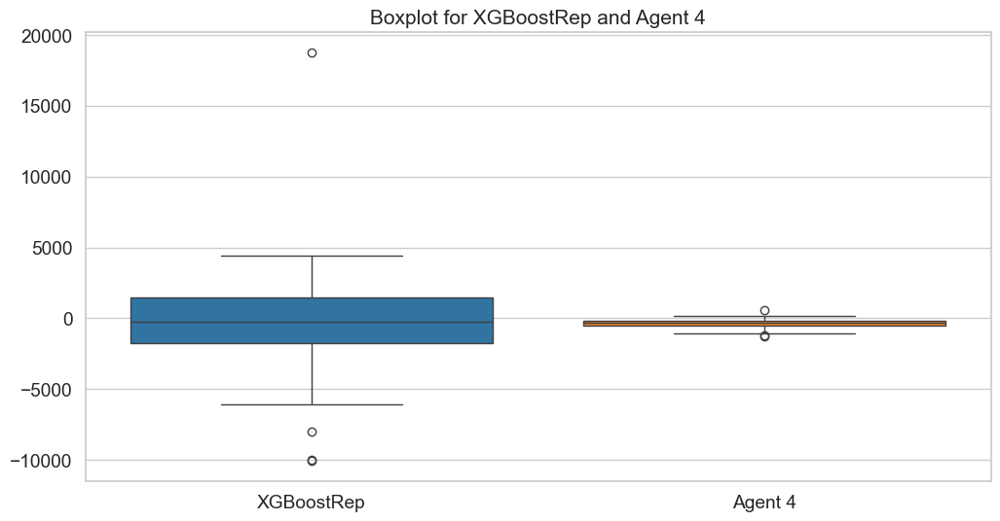

P_value_XGBoostRep 8.48212736918389e-09
pvalue_other_agent  0.0009267008807645834
not normal
There isn't a statistically significant difference


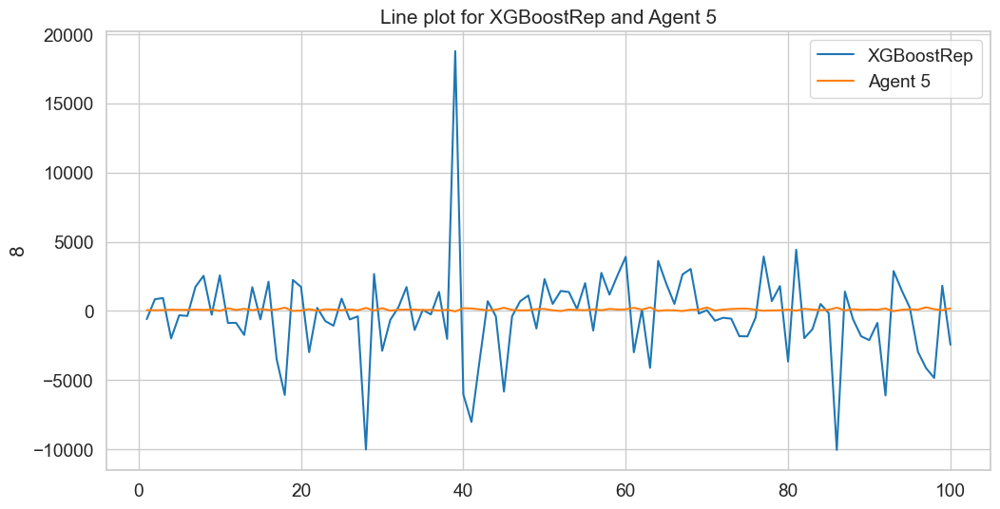

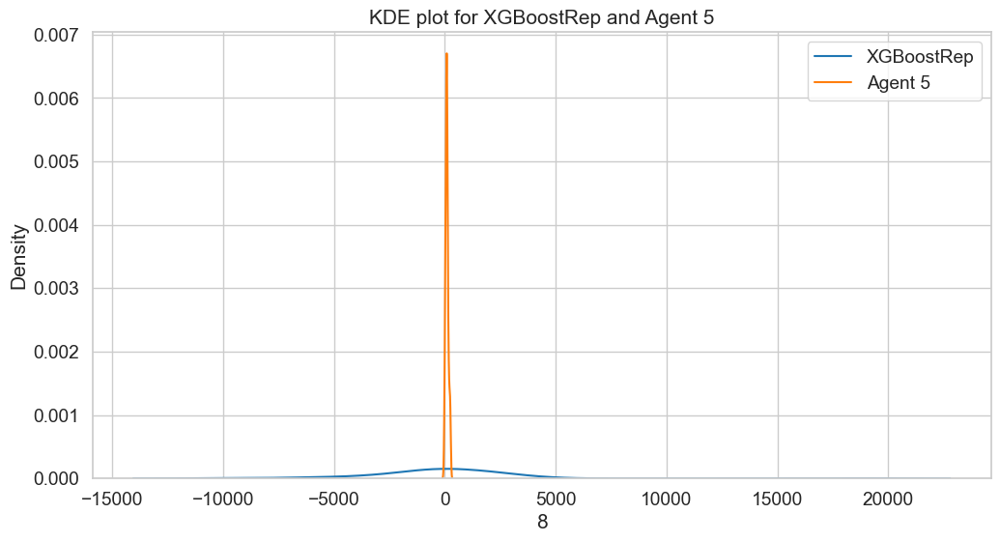

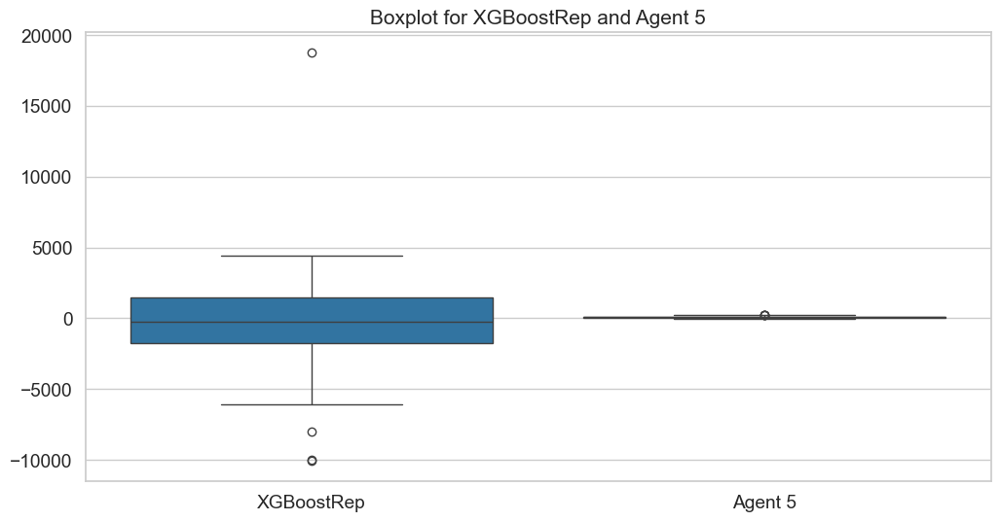

P_value_XGBoostRep 8.48212736918389e-09
pvalue_other_agent  0.0037123767583105544
not normal
There isn't a statistically significant difference


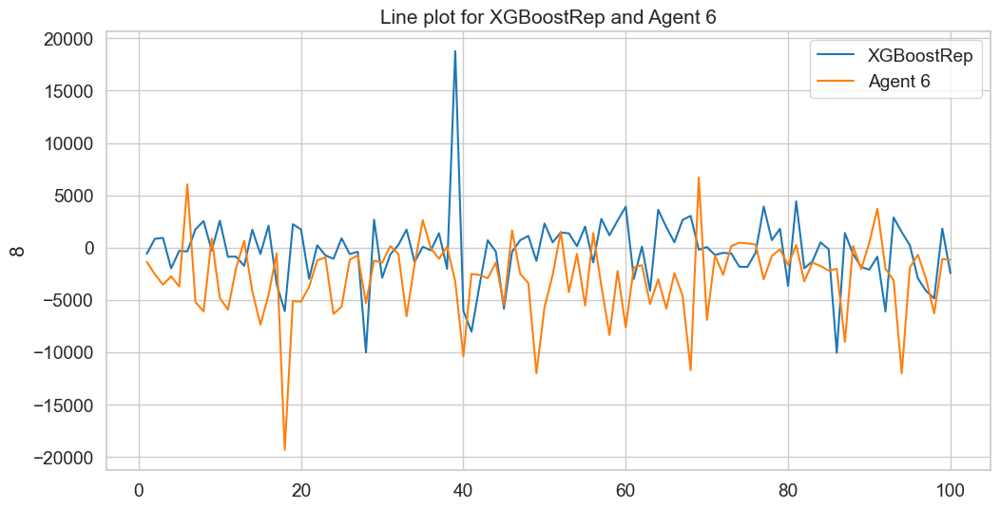

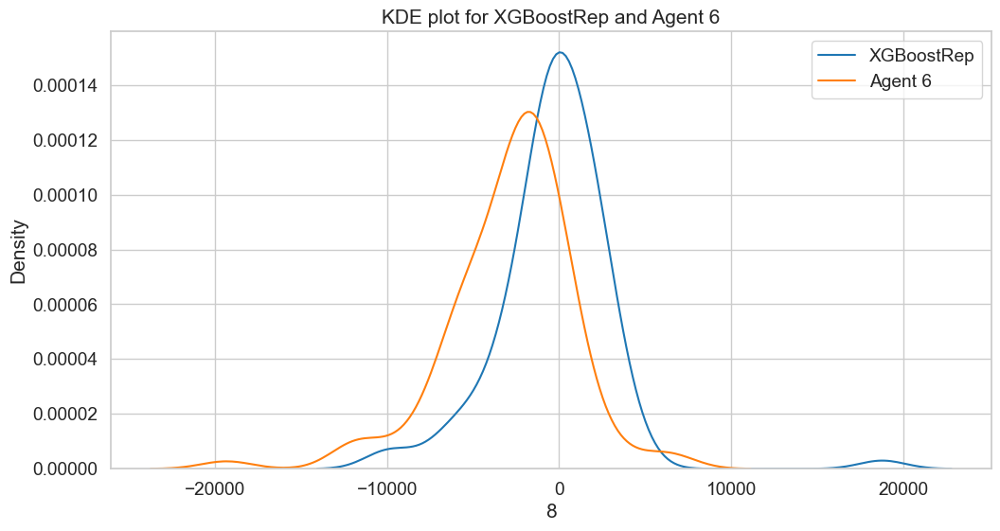

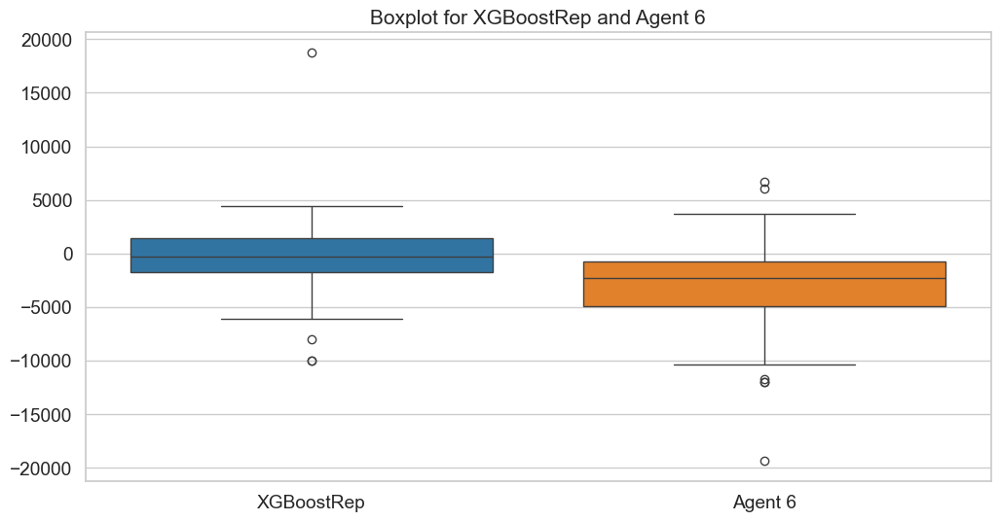

P_value_XGBoostRep 8.48212736918389e-09
pvalue_other_agent  2.396108617568023e-05
not normal
There is a statistically significant difference
P-Value 7.586692717498108e-09



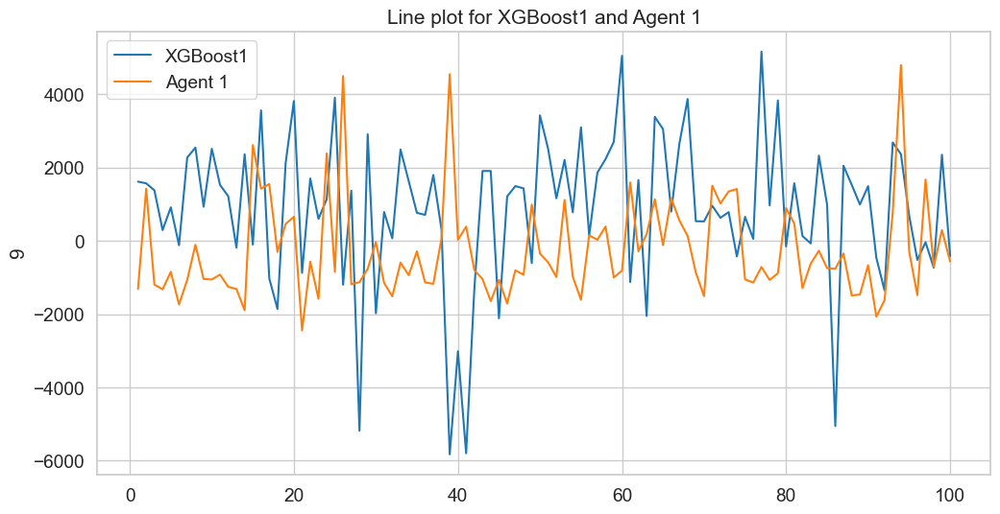

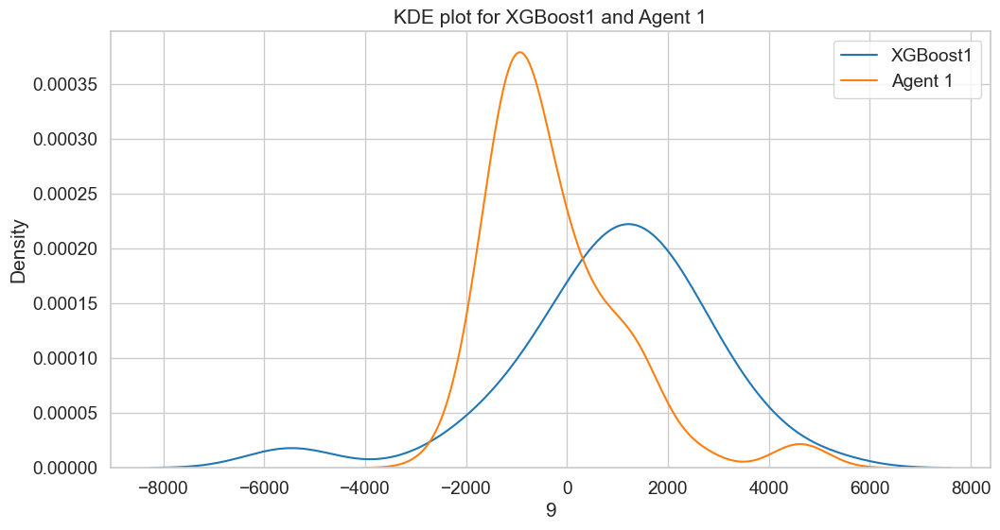

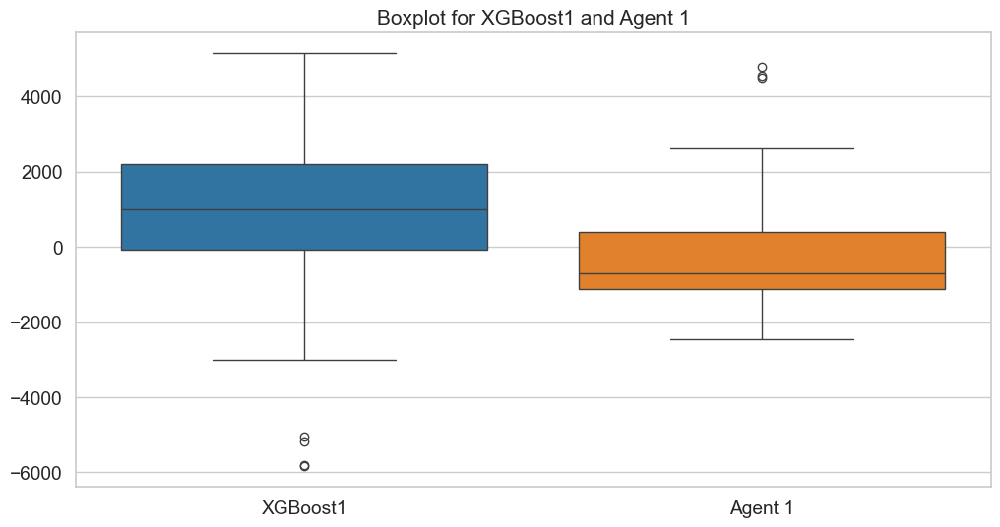

P_value_XGBoost1 7.40869187453485e-05
pvalue_other_agent  3.861357709350255e-08
not normal
There is a statistically significant difference
P-Value 6.753578546145334e-09



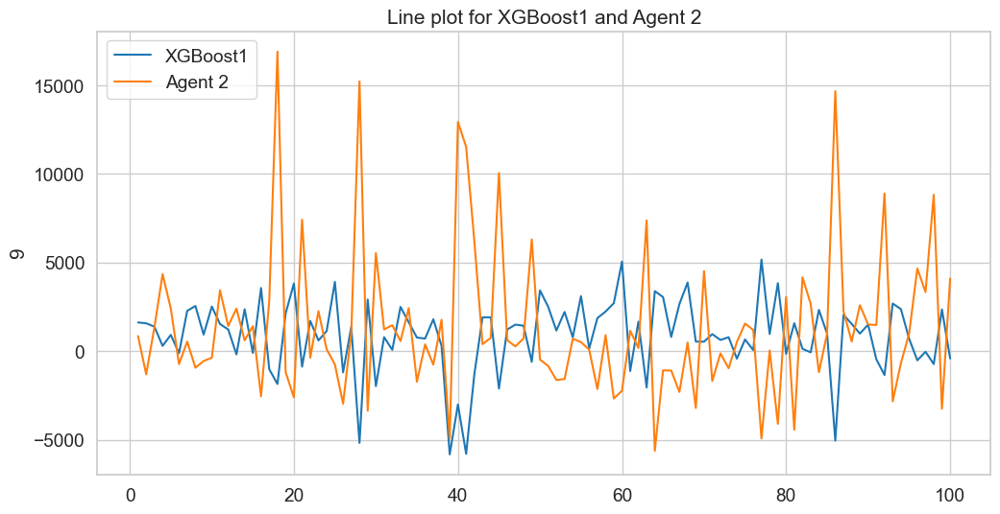

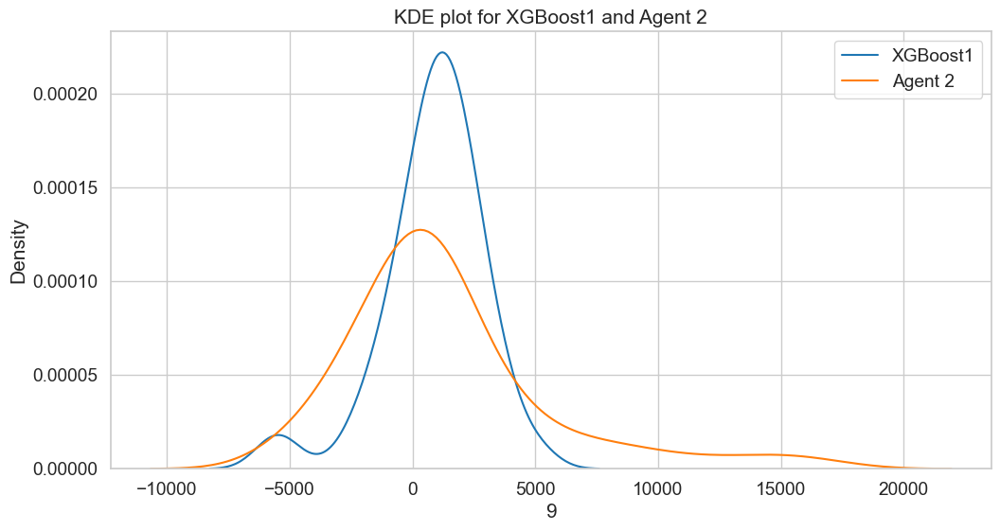

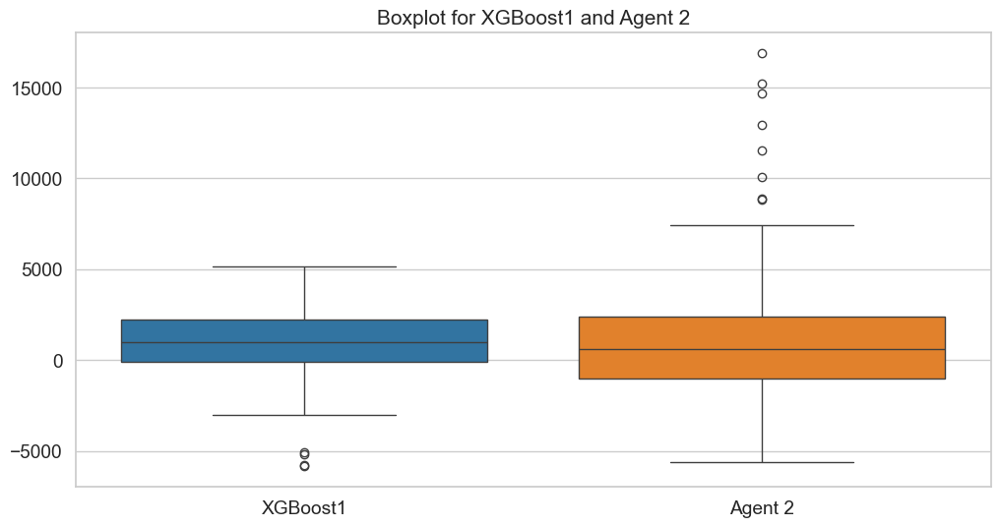

P_value_XGBoost1 7.40869187453485e-05
pvalue_other_agent  4.711992036072101e-08
not normal
There isn't a statistically significant difference


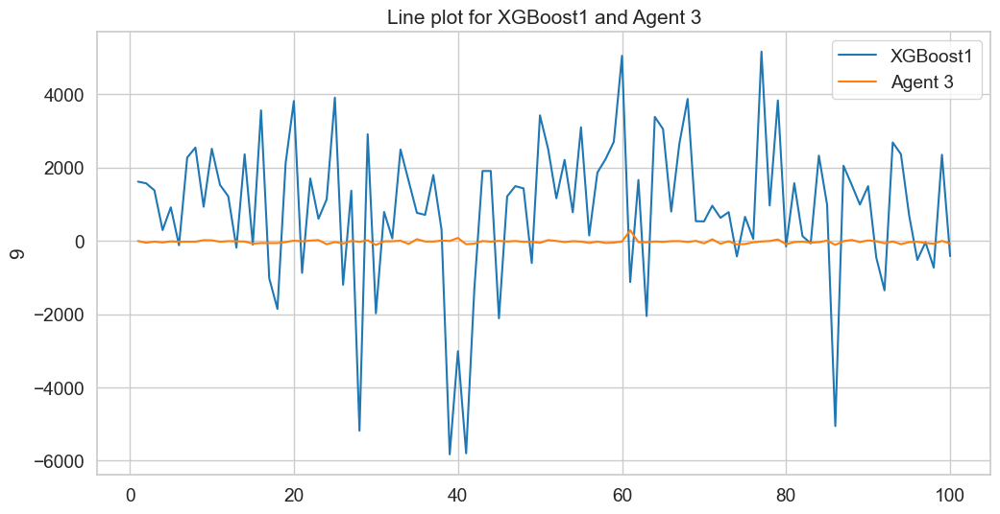

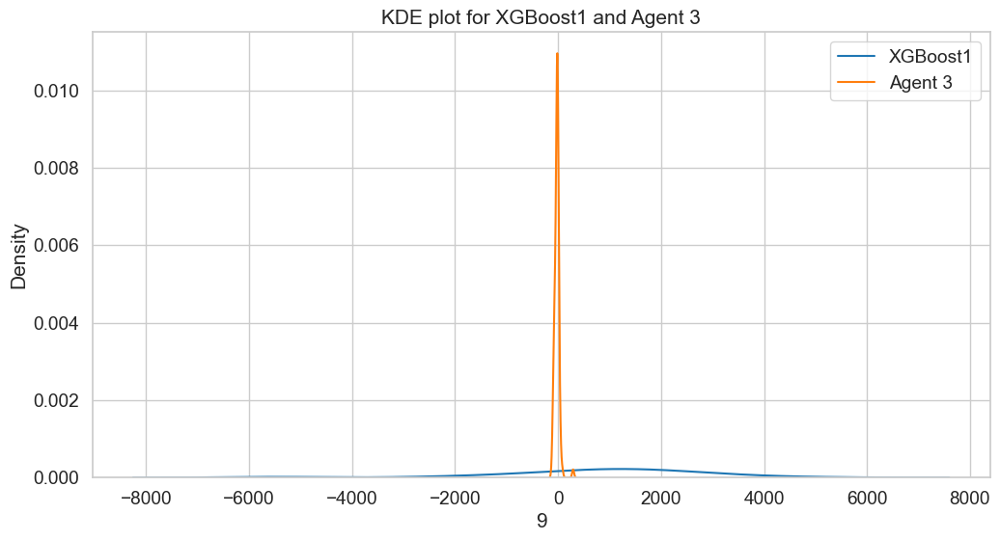

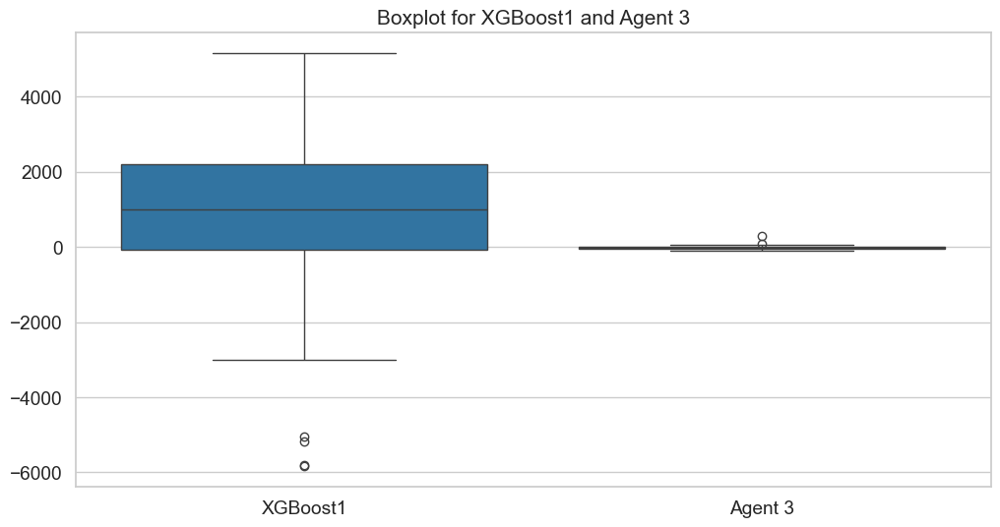

P_value_XGBoost1 7.40869187453485e-05
pvalue_other_agent  1.7379104175721235e-10
not normal
There is a statistically significant difference
P-Value 1.0730676753162289e-08



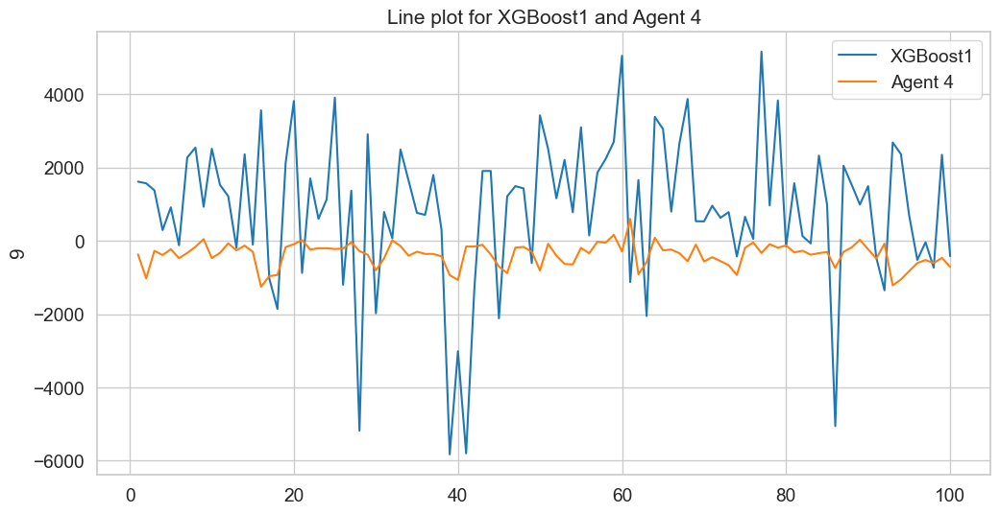

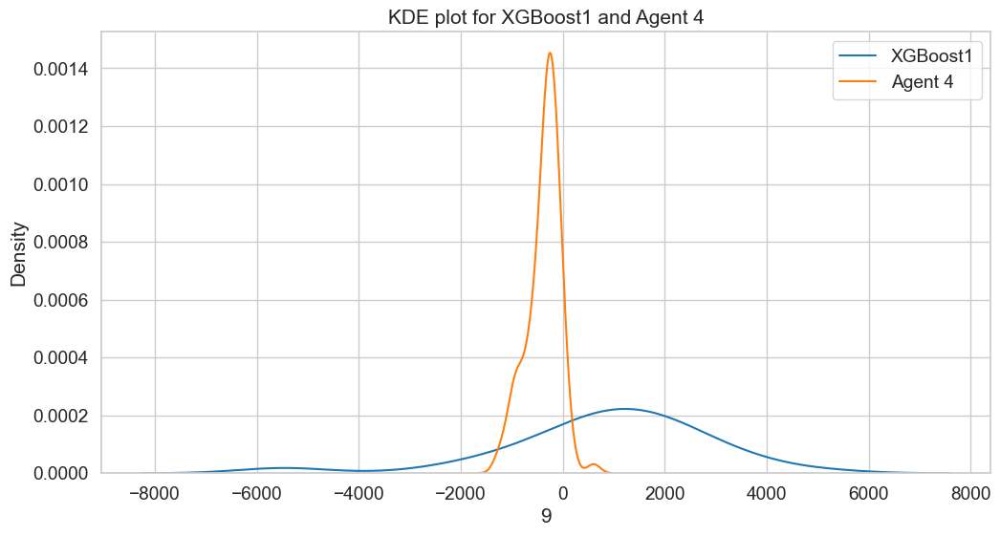

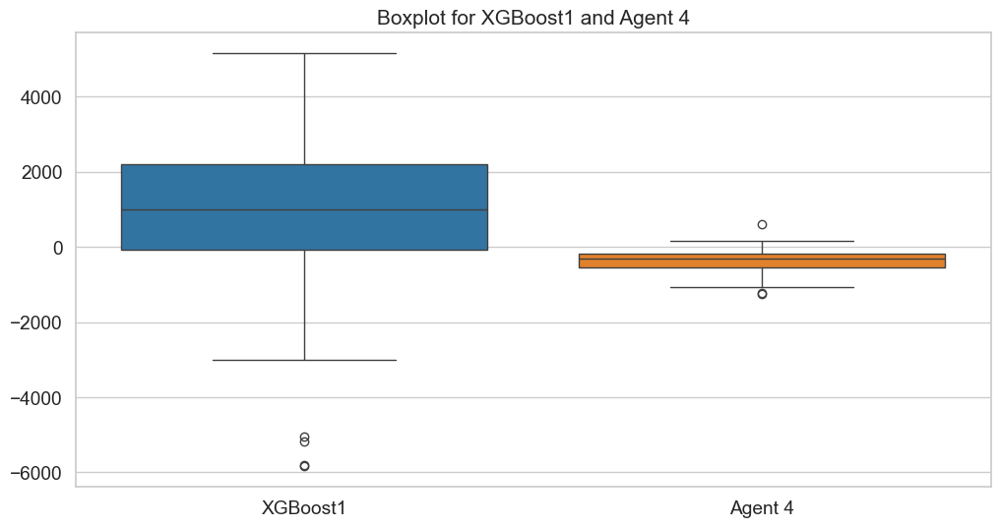

P_value_XGBoost1 7.40869187453485e-05
pvalue_other_agent  0.0009267008807645834
not normal
There is a statistically significant difference
P-Value 4.4544435160501645e-13



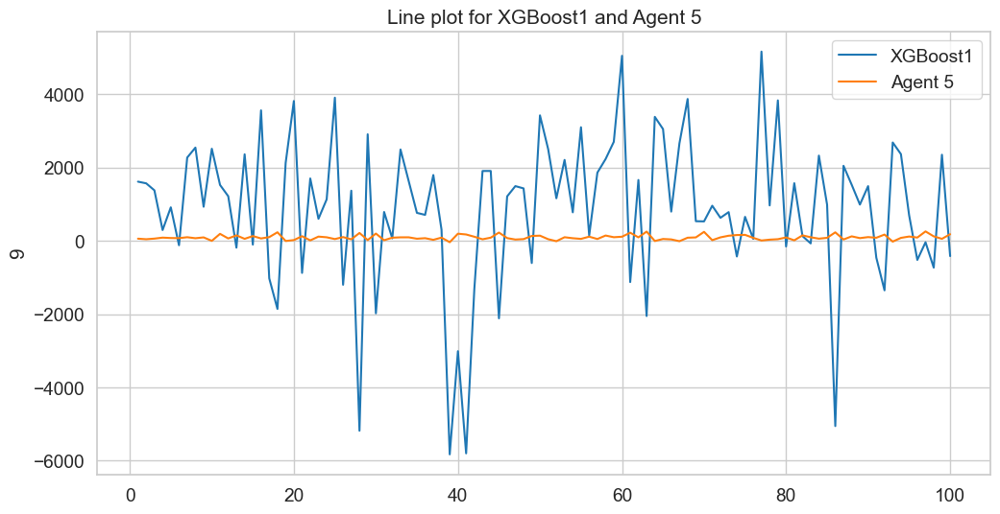

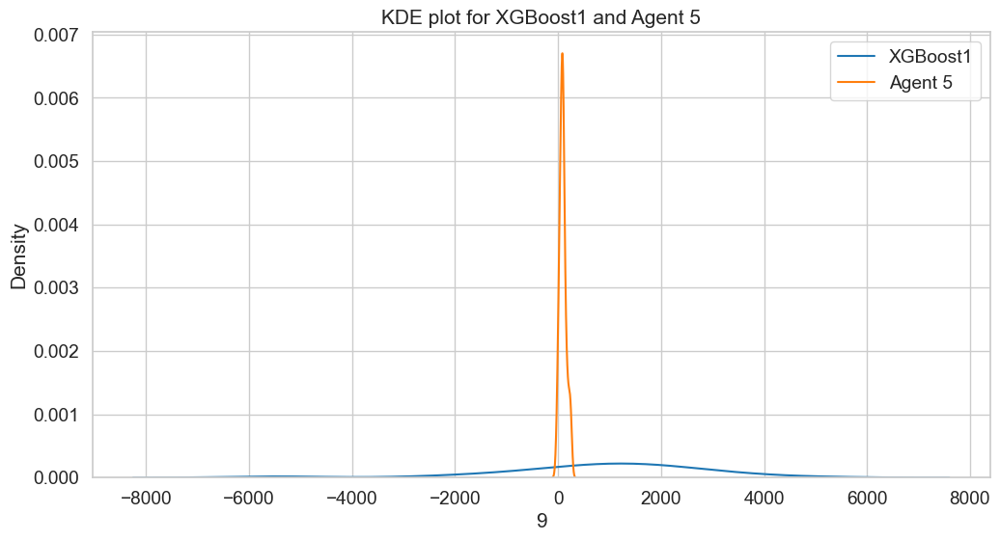

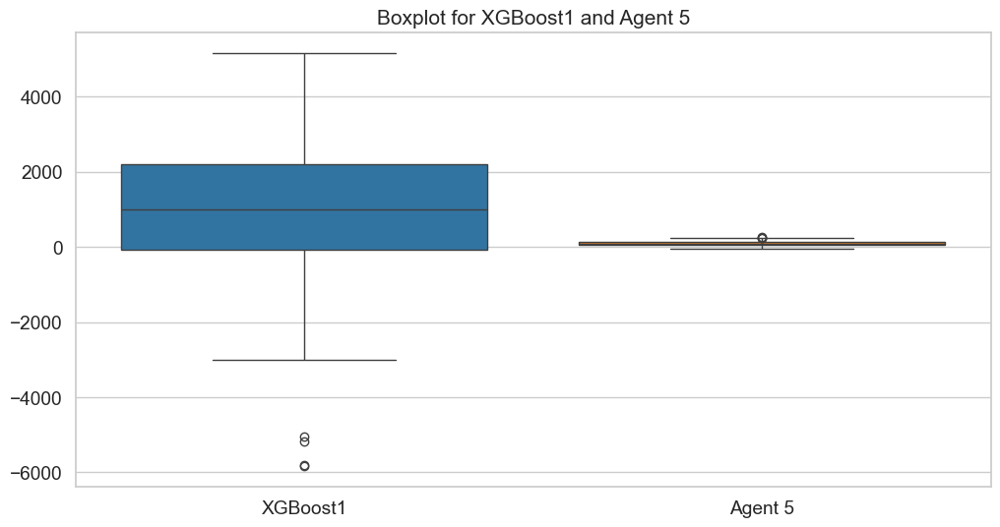

P_value_XGBoost1 7.40869187453485e-05
pvalue_other_agent  0.0037123767583105544
not normal
There is a statistically significant difference
P-Value 2.0919044541043978e-07



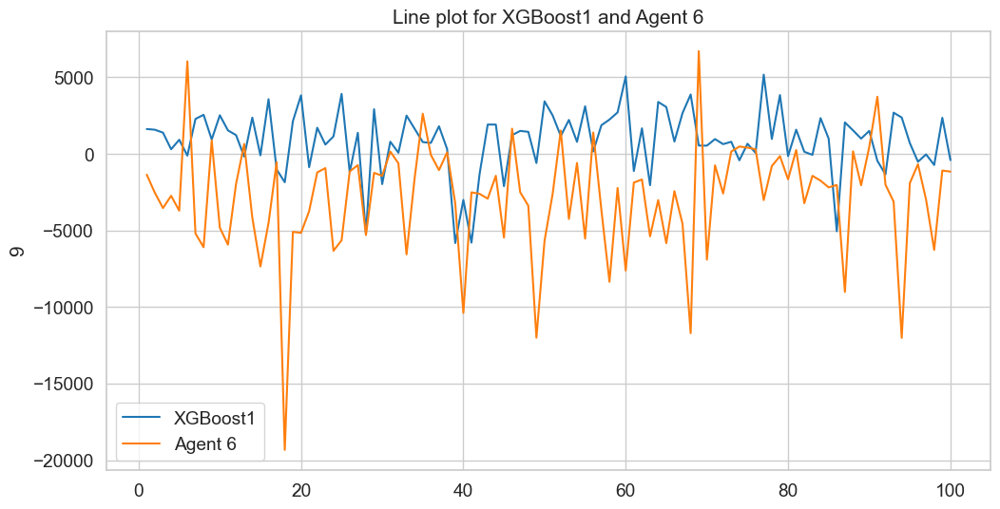

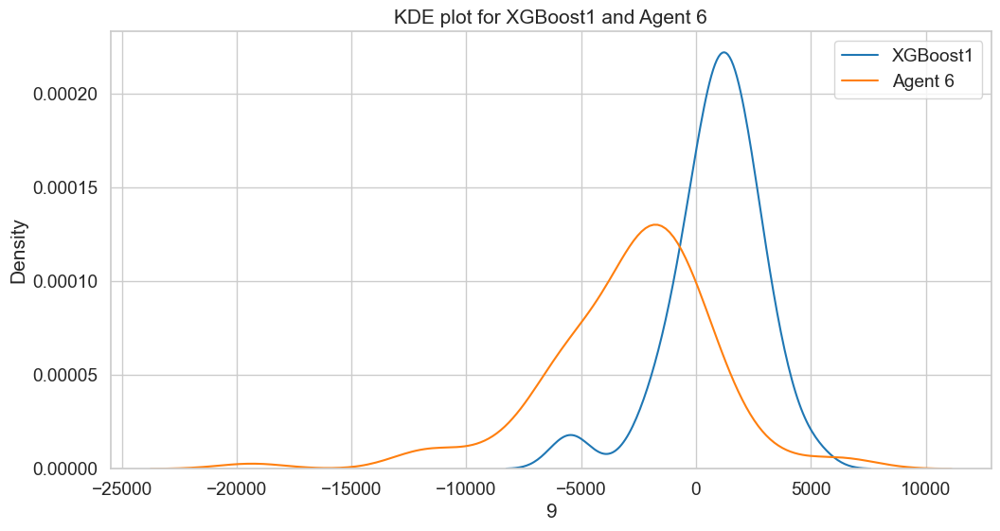

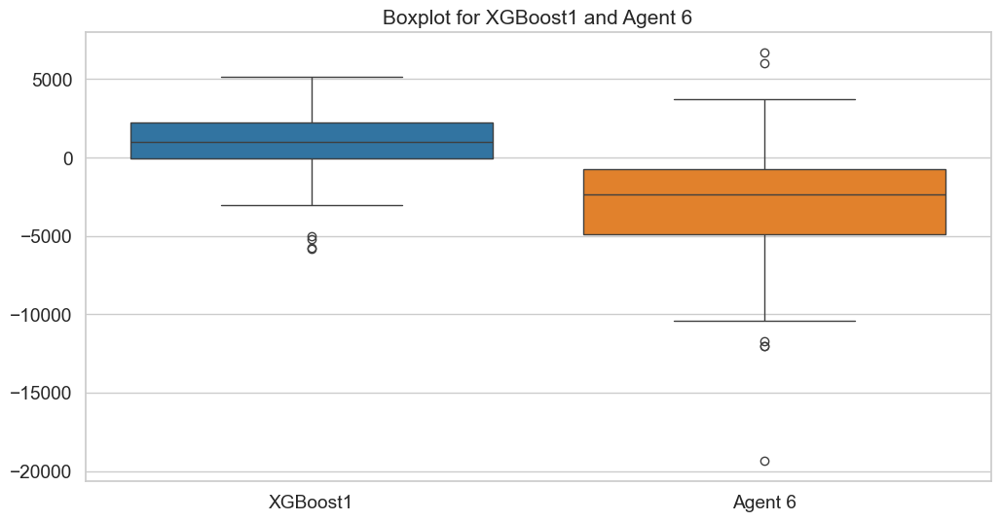

P_value_XGBoost1 7.40869187453485e-05
pvalue_other_agent  2.396108617568023e-05
not normal
There is a statistically significant difference
P-Value 2.460526346907824e-18



In [20]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

xgboostOG_avg_balance = averaged_df.iloc[:, -3]  # third last column
xgboostRep_avg_balance = averaged_df.iloc[:, -2]  # second column
xgboost1_avg_balance = averaged_df.iloc[:, -1]  # Last column

# List to hold the two agents
agents = [
    ("XGBoostOG", xgboost1_avg_balance),
    ("XGBoostRep", xgboostRep_avg_balance),
    ("XGBoost1", xgboost1_avg_balance),
]

# Loop through the two agents
for agent_name, agent in agents:
    # Loop through columns 1 to second last for other agents
    for col_index in range(averaged_df.shape[1] - 3):
        other_agent_balance = averaged_df.iloc[:, col_index]

        # Line plot for XGBoost and the other agent
        plt.figure(figsize=(12, 6))
        sns.lineplot(data=agent, label=agent_name)
        sns.lineplot(data=other_agent_balance, label="Agent " + str(col_index + 1))
        plt.title("Line plot for " + agent_name + " and Agent " + str(col_index + 1))
        plt.legend()
        plt.show()

        # KDE plot for the distributions
        plt.figure(figsize=(12, 6))
        sns.kdeplot(agent, label=agent_name)
        sns.kdeplot(other_agent_balance, label="Agent " + str(col_index + 1))
        plt.title("KDE plot for " + agent_name + " and Agent " + str(col_index + 1))
        plt.legend()
        plt.show()

        # Boxplot for the two distributions
        combined_data = pd.concat(
            [
                agent.rename(agent_name),
                other_agent_balance.rename("Agent " + str(col_index + 1)),
            ],
            axis=1,
        )
        plt.figure(figsize=(12, 6))
        sns.boxplot(data=combined_data)
        plt.title("Boxplot for " + agent_name + " and Agent " + str(col_index + 1))
        plt.show()

        # Check normality for both columns
        _, pvalue_xgboost = stats.shapiro(agent)
        _, pvalue_other_agent = stats.shapiro(other_agent_balance)
        print("P_value_" + agent_name, pvalue_xgboost)
        print("pvalue_other_agent ", pvalue_other_agent)

        # If both are normally distributed
        if pvalue_xgboost > 0.05 and pvalue_other_agent > 0.05:
            print("normal")
            statistic, pvalue = stats.ttest_ind(agent, other_agent_balance)
            if pvalue < 0.05:
                print("There is a statistically significant difference")
            else:
                print("There isn't a statistically significant difference")
        else:
            print("not normal")
            # If either or both are not normally distributed
            statistic, pvalue = stats.mannwhitneyu(agent, other_agent_balance)
            if pvalue < 0.05:
                print("There is a statistically significant difference")
                print("P-Value", pvalue)
                print("")
            else:
                print("There isn't a statistically significant difference")

In [11]:
averaged_df.shape

(100, 8)

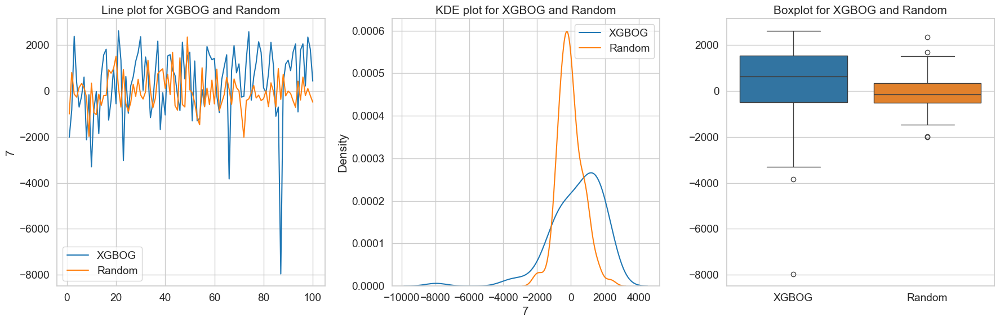

P_value_XGBOG 1.619919581736182e-07
P_value_Random 0.05281566905392371
not normal
There is a statistically significant difference
P-Value 0.0010374753182760608



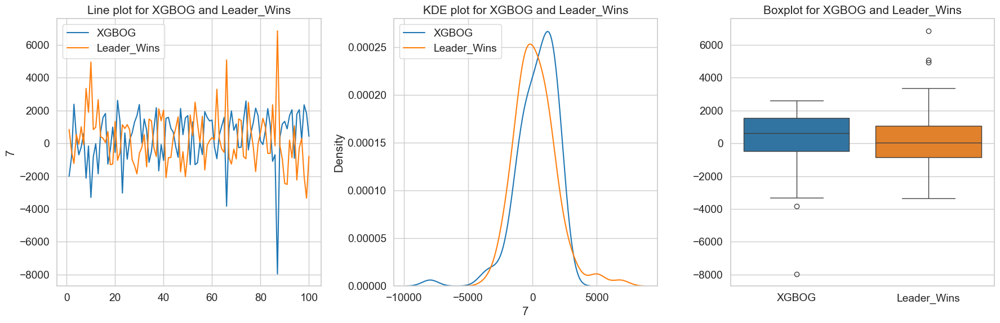

P_value_XGBOG 1.619919581736182e-07
P_value_Leader_Wins 0.00045680095259250503
not normal
There isn't a statistically significant difference
P-Value 0.19370833943777388


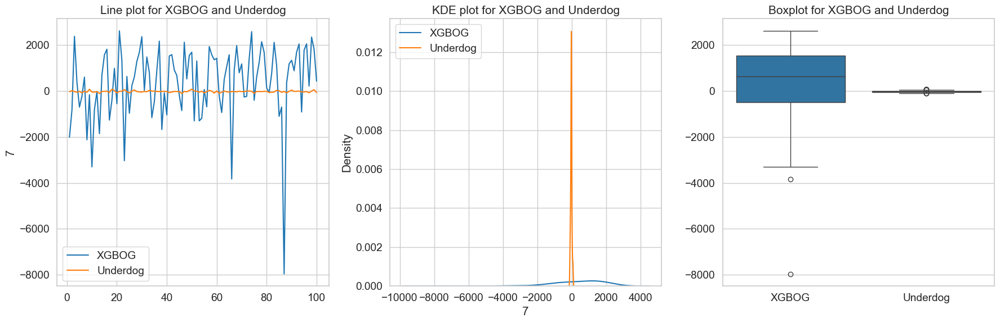

P_value_XGBOG 1.619919581736182e-07
P_value_Underdog 0.004694742723332053
not normal
There is a statistically significant difference
P-Value 0.0006003677894692835



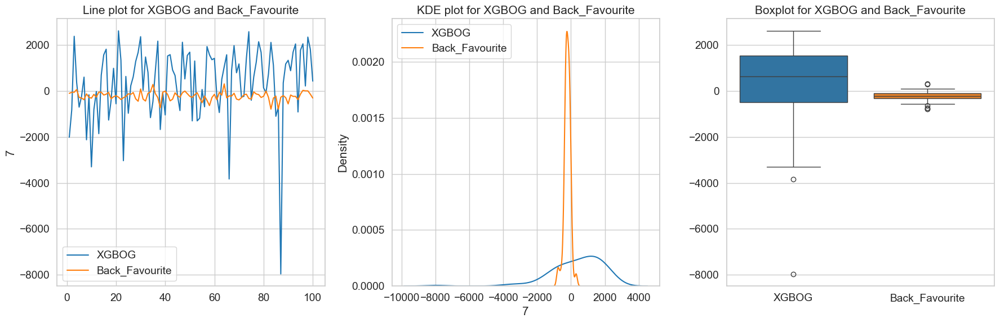

P_value_XGBOG 1.619919581736182e-07
P_value_Back_Favourite 0.0015676633796593493
not normal
There is a statistically significant difference
P-Value 1.6976498032482443e-05



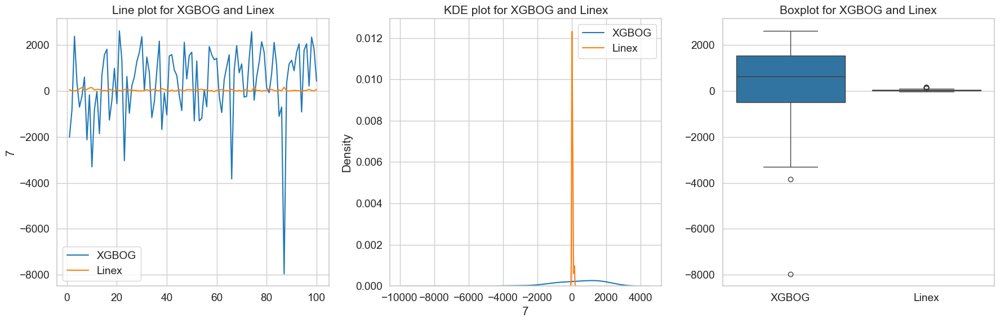

P_value_XGBOG 1.619919581736182e-07
P_value_Linex 4.2187921758699996e-07
not normal
There is a statistically significant difference
P-Value 0.002342965676631893



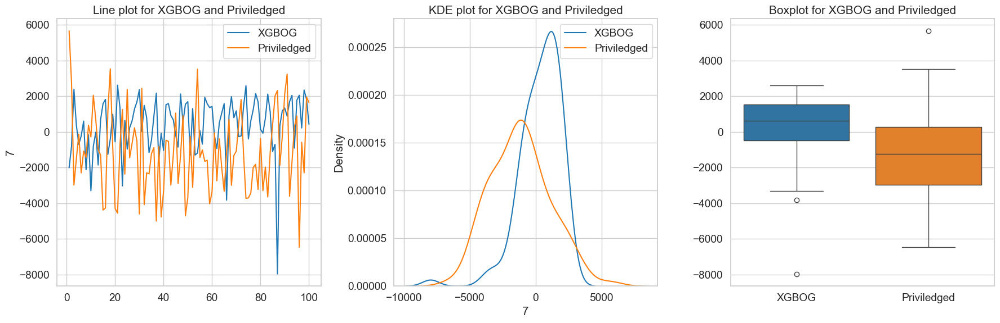

P_value_XGBOG 1.619919581736182e-07
P_value_Priviledged 0.5018121552779776
not normal
There is a statistically significant difference
P-Value 7.2228356931968e-06



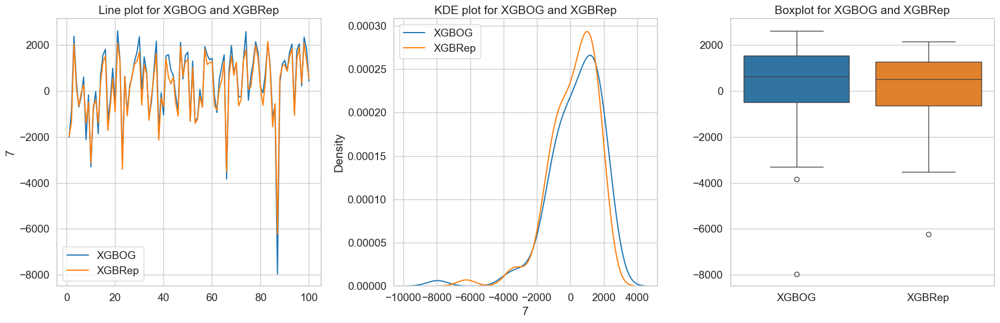

P_value_XGBOG 1.619919581736182e-07
P_value_XGBRep 2.79800408770409e-06
not normal
There is a statistically significant difference
P-Value 1.746378554002198e-08



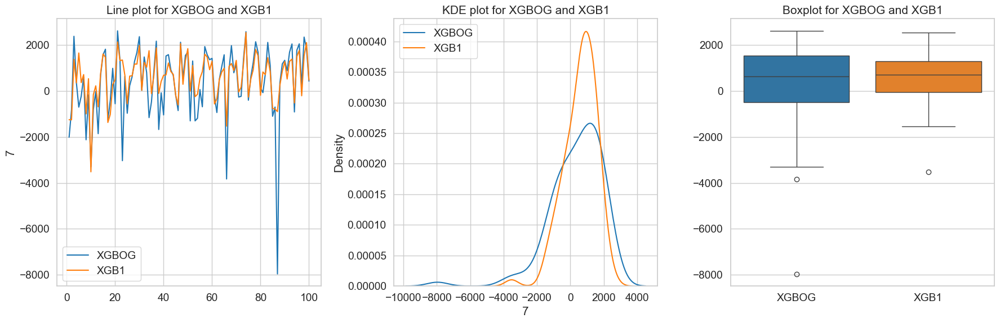

P_value_XGBOG 1.619919581736182e-07
P_value_XGB1 0.0011483800372130287
not normal
There isn't a statistically significant difference
P-Value 0.5681610364103444


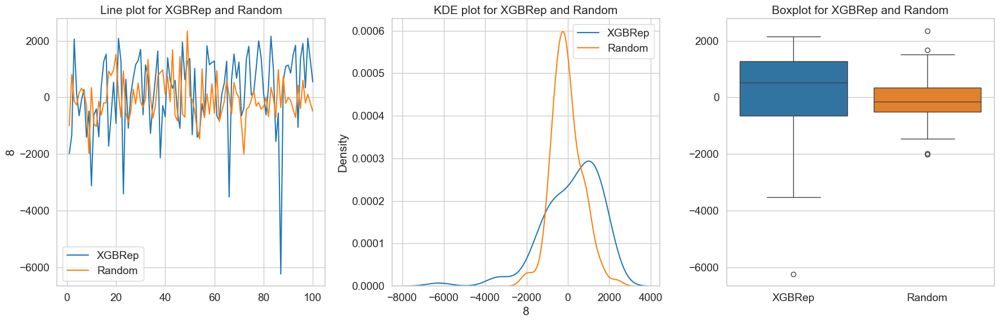

P_value_XGBRep 2.79800408770409e-06
P_value_Random 0.05281566905392371
not normal
There is a statistically significant difference
P-Value 0.015061551058980152



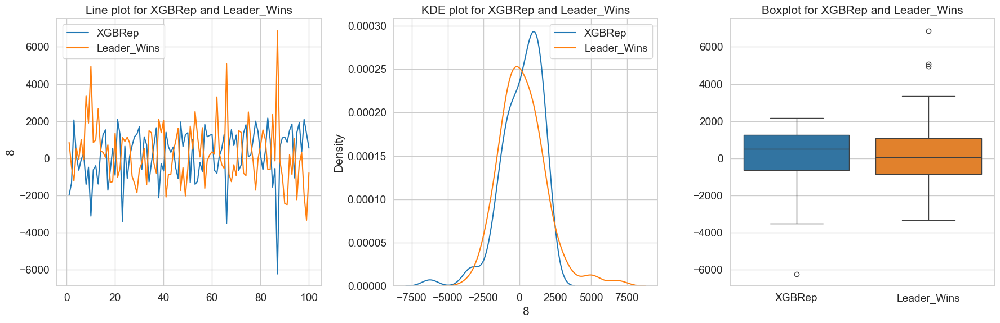

P_value_XGBRep 2.79800408770409e-06
P_value_Leader_Wins 0.00045680095259250503
not normal
There isn't a statistically significant difference
P-Value 0.5202456779483677


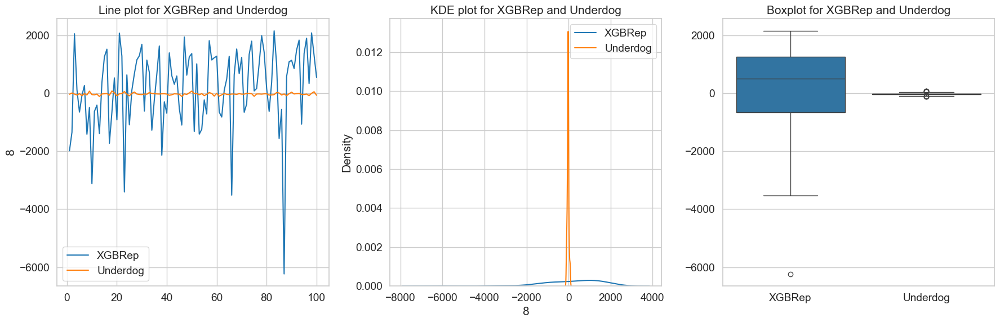

P_value_XGBRep 2.79800408770409e-06
P_value_Underdog 0.004694742723332053
not normal
There is a statistically significant difference
P-Value 0.015205074947262165



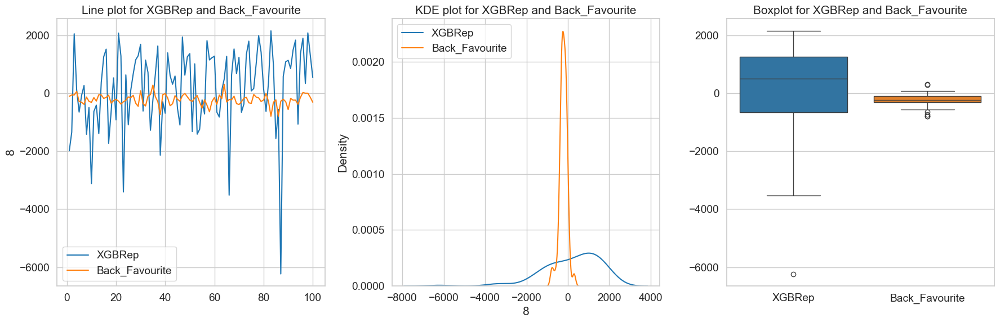

P_value_XGBRep 2.79800408770409e-06
P_value_Back_Favourite 0.0015676633796593493
not normal
There is a statistically significant difference
P-Value 0.00032683051898161746



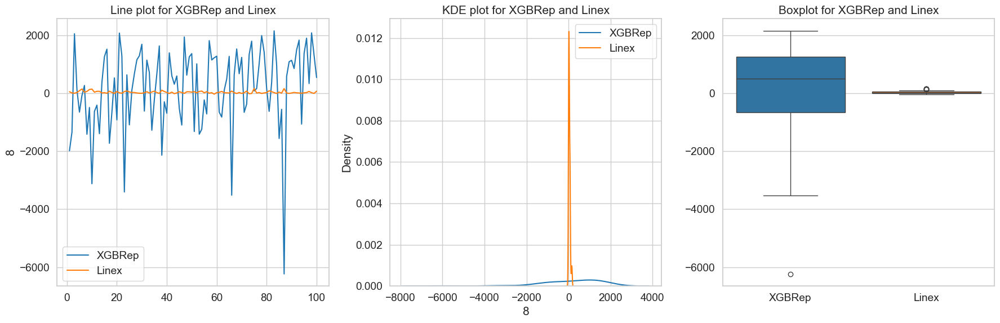

P_value_XGBRep 2.79800408770409e-06
P_value_Linex 4.2187921758699996e-07
not normal
There isn't a statistically significant difference
P-Value 0.06238182359673901


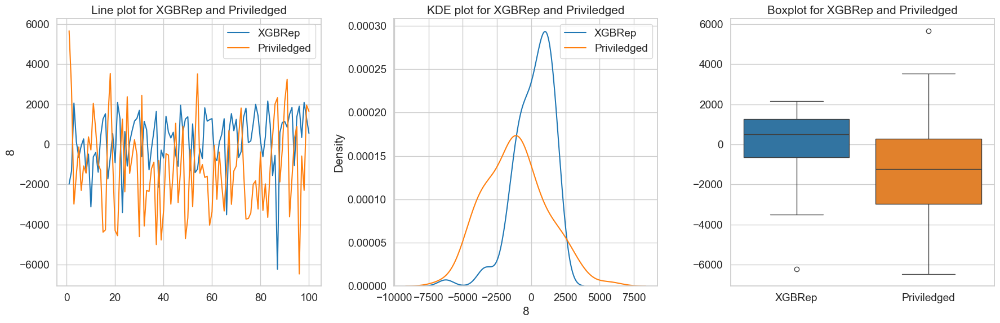

P_value_XGBRep 2.79800408770409e-06
P_value_Priviledged 0.5018121552779776
not normal
There is a statistically significant difference
P-Value 3.5294333899988745e-05



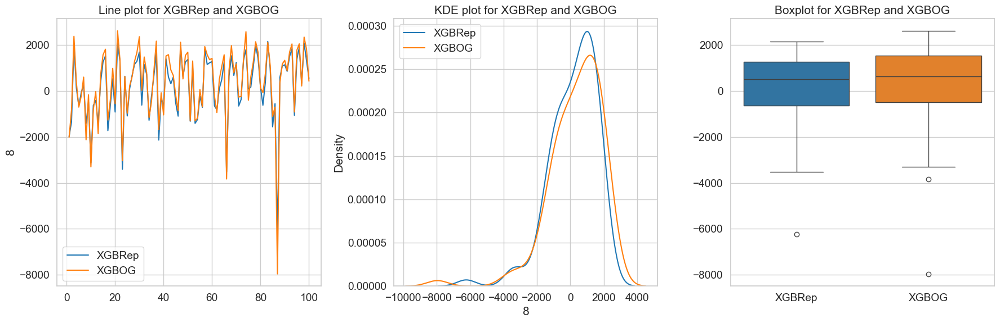

P_value_XGBRep 2.79800408770409e-06
P_value_XGBOG 1.619919581736182e-07
not normal
There is a statistically significant difference
P-Value 1.746378554002198e-08



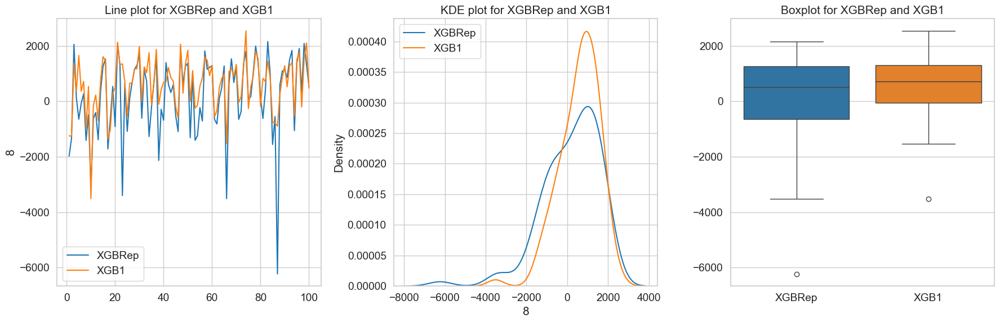

P_value_XGBRep 2.79800408770409e-06
P_value_XGB1 0.0011483800372130287
not normal
There is a statistically significant difference
P-Value 6.770862440571828e-06



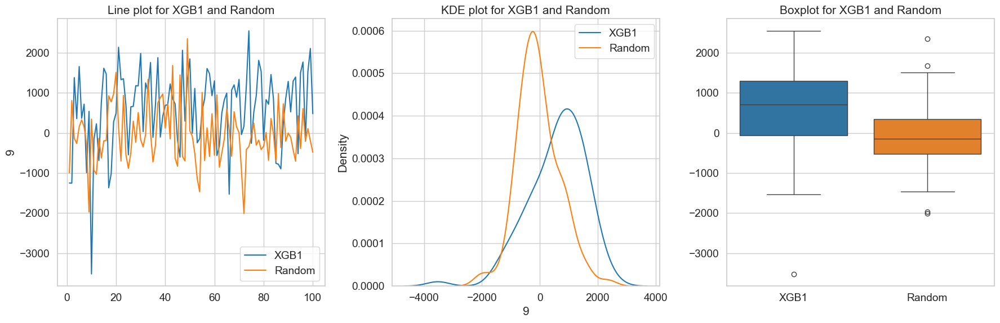

P_value_XGB1 0.0011483800372130287
P_value_Random 0.05281566905392371
not normal
There is a statistically significant difference
P-Value 6.994988008527533e-07



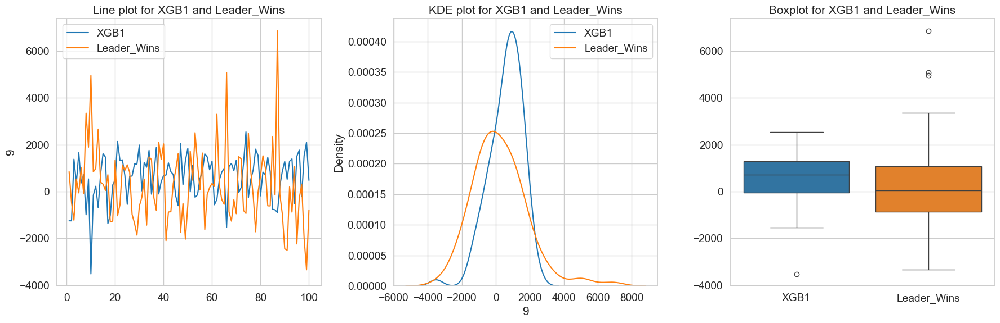

P_value_XGB1 0.0011483800372130287
P_value_Leader_Wins 0.00045680095259250503
not normal
There is a statistically significant difference
P-Value 0.021048355887367972



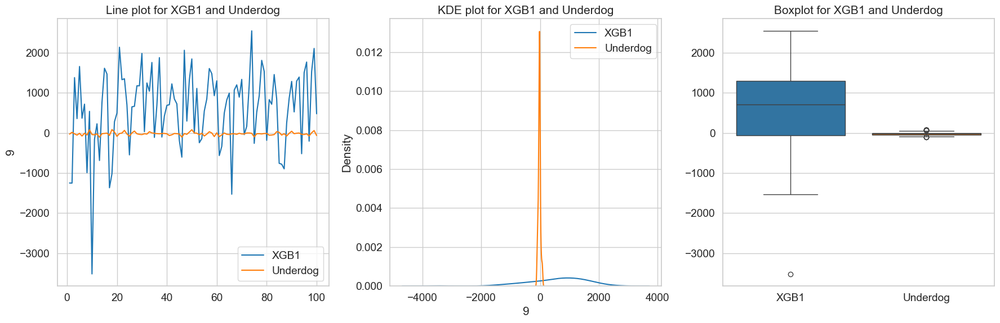

P_value_XGB1 0.0011483800372130287
P_value_Underdog 0.004694742723332053
not normal
There is a statistically significant difference
P-Value 1.0782686894393923e-08



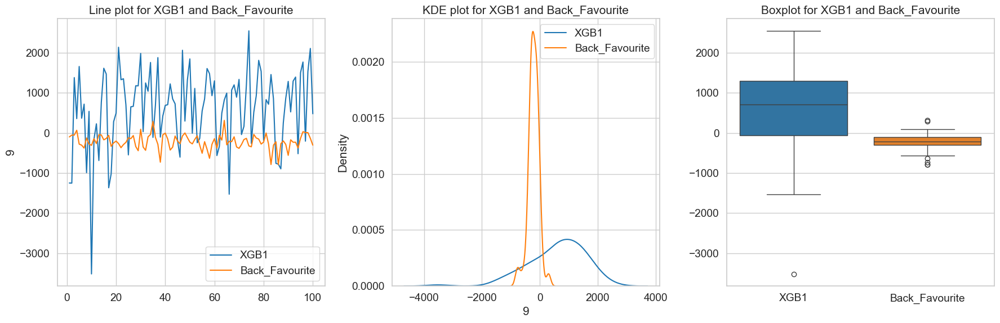

P_value_XGB1 0.0011483800372130287
P_value_Back_Favourite 0.0015676633796593493
not normal
There is a statistically significant difference
P-Value 4.783742429152475e-11



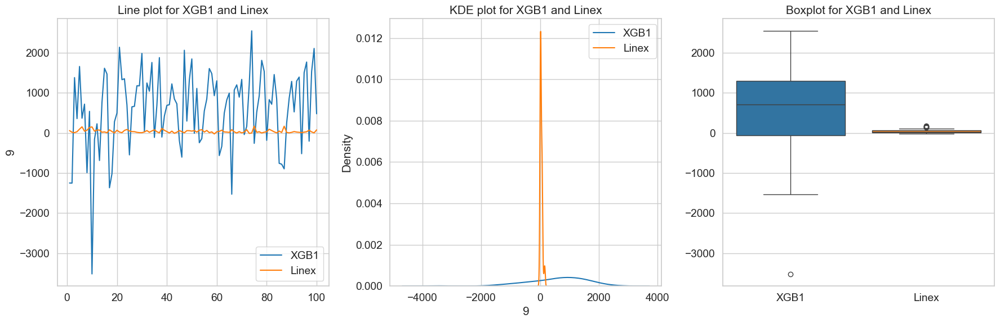

P_value_XGB1 0.0011483800372130287
P_value_Linex 4.2187921758699996e-07
not normal
There is a statistically significant difference
P-Value 1.30723624607853e-07



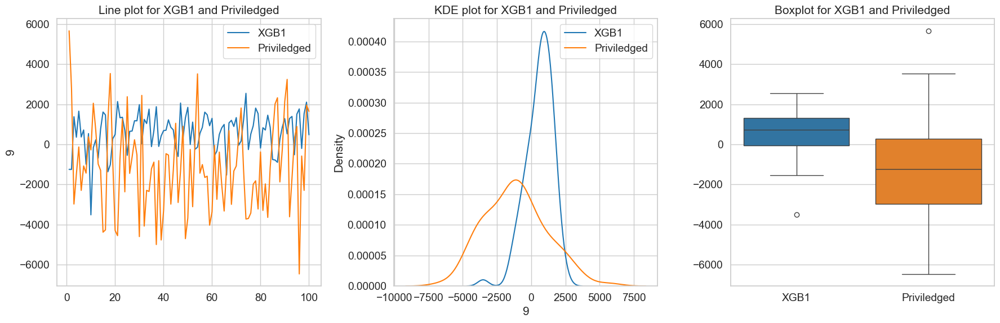

P_value_XGB1 0.0011483800372130287
P_value_Priviledged 0.5018121552779776
not normal
There is a statistically significant difference
P-Value 1.259072889123473e-07



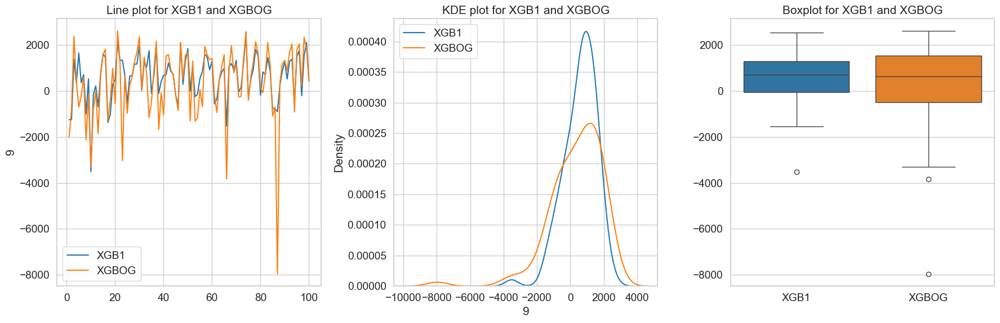

P_value_XGB1 0.0011483800372130287
P_value_XGBOG 1.619919581736182e-07
not normal
There isn't a statistically significant difference
P-Value 0.5681610364103444


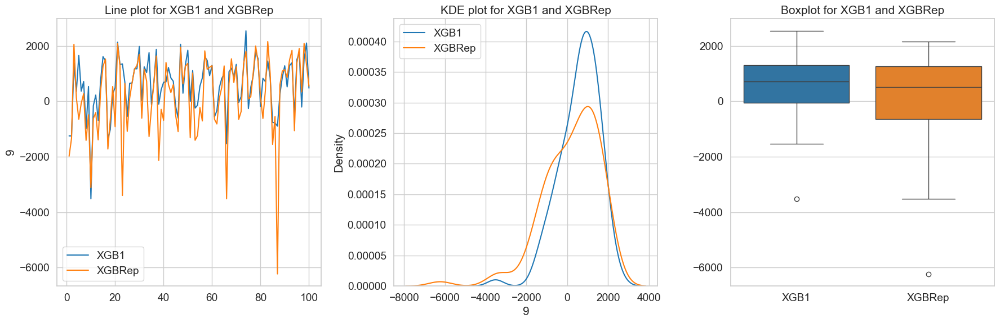

P_value_XGB1 0.0011483800372130287
P_value_XGBRep 2.79800408770409e-06
not normal
There is a statistically significant difference
P-Value 6.770862440571828e-06



In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

# Define agent names for easier access and readability
agent_names = [
    "Random",
    "Leader_Wins",
    "Underdog",
    "Back_Favourite",
    "Linex",
    "Priviledged",
    "XGBOG",
    "XGBRep",
    "XGB1",
]

# Define the indices of 'XGBoost1_NoBal' and 'XGBoost1_2000NoBal' in the agent_names list
xgboost_indices = [6, 7, 8]

# Loop through 'XGBoost1_NoBal' and 'XGBoost1_2000NoBal'
for col_index in xgboost_indices:
    agent_balance = averaged_df.iloc[:, col_index]
    agent_name = agent_names[col_index]

    # Loop through all other agents
    for other_col_index in range(averaged_df.shape[1]):
        other_agent_name = agent_names[other_col_index]

        # Skip if the agent is the same
        if agent_name == other_agent_name:
            continue

        other_agent_balance = averaged_df.iloc[:, other_col_index]

        # Group the plots horizontally
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        # Line plot for the agent and the other agent
        sns.lineplot(data=agent_balance, ax=axes[0], label=agent_name)
        sns.lineplot(data=other_agent_balance, ax=axes[0], label=other_agent_name)
        axes[0].set_title(f"Line plot for {agent_name} and {other_agent_name}")
        axes[0].legend()

        # KDE plot for the distributions
        sns.kdeplot(agent_balance, ax=axes[1], label=agent_name)
        sns.kdeplot(other_agent_balance, ax=axes[1], label=other_agent_name)
        axes[1].set_title(f"KDE plot for {agent_name} and {other_agent_name}")
        axes[1].legend()

        # Boxplot for the two distributions
        combined_data = pd.concat(
            [
                agent_balance.rename(agent_name),
                other_agent_balance.rename(other_agent_name),
            ],
            axis=1,
        )
        sns.boxplot(data=combined_data, ax=axes[2])
        axes[2].set_title(f"Boxplot for {agent_name} and {other_agent_name}")

        plt.tight_layout()
        plt.show()

        # Check normality for both columns
        _, pvalue_agent = stats.shapiro(agent_balance)
        _, pvalue_other_agent = stats.shapiro(other_agent_balance)
        print(f"P_value_{agent_name}", pvalue_agent)
        print(f"P_value_{other_agent_name}", pvalue_other_agent)

        # If both are normally distributed
        if pvalue_agent > 0.05 and pvalue_other_agent > 0.05:
            print("normal")
            statistic, pvalue = stats.ttest_rel(agent_balance, other_agent_balance)
            if pvalue < 0.05:
                print("There is a statistically significant difference")
            else:
                print("There isn't a statistically significant difference")
        else:
            print("not normal")
            # If either or both are not normally distributed
            statistic, pvalue = stats.wilcoxon(agent_balance, other_agent_balance)
            if pvalue < 0.05:
                print("There is a statistically significant difference")
                print("P-Value", pvalue)
                print("")
            else:
                print("There isn't a statistically significant difference")
                print("P-Value", pvalue)

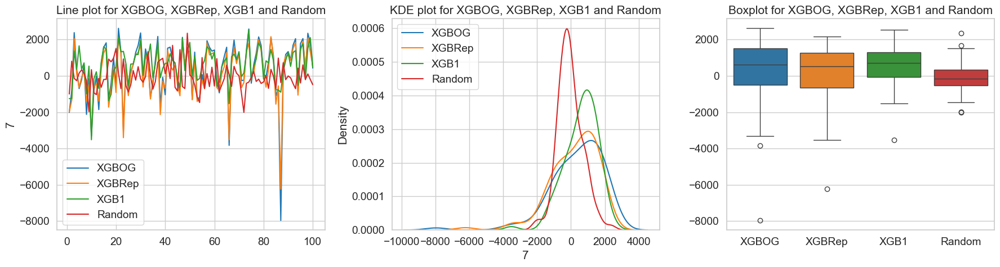

P_value_XGBoostOG 1.619919581736182e-07
P_value_XGBoostRep 2.79800408770409e-06
P_value_XGBoost1 0.0011483800372130287
P_value_Random 0.05281566905392371
not normal
There is a statistically significant difference
P-Value 1.6732668195556873e-10



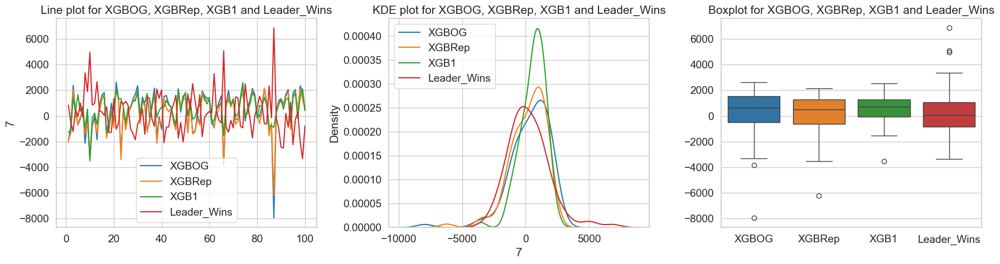

P_value_XGBoostOG 1.619919581736182e-07
P_value_XGBoostRep 2.79800408770409e-06
P_value_XGBoost1 0.0011483800372130287
P_value_Leader_Wins 0.00045680095259250503
not normal
There is a statistically significant difference
P-Value 9.96991662464824e-06



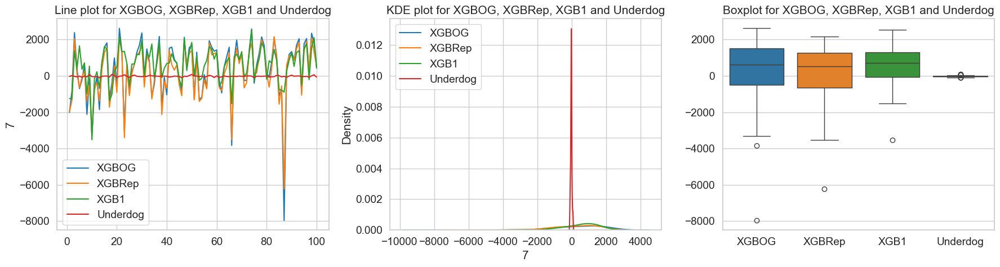

P_value_XGBoostOG 1.619919581736182e-07
P_value_XGBoostRep 2.79800408770409e-06
P_value_XGBoost1 0.0011483800372130287
P_value_Underdog 0.004694742723332053
not normal
There is a statistically significant difference
P-Value 2.129420159920762e-09



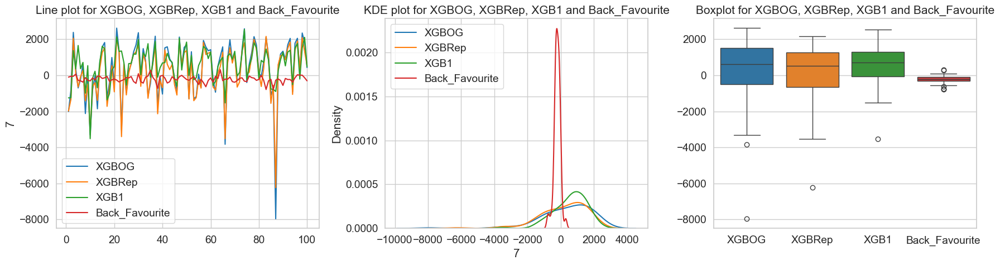

P_value_XGBoostOG 1.619919581736182e-07
P_value_XGBoostRep 2.79800408770409e-06
P_value_XGBoost1 0.0011483800372130287
P_value_Back_Favourite 0.0015676633796593493
not normal
There is a statistically significant difference
P-Value 3.2571268145907254e-13



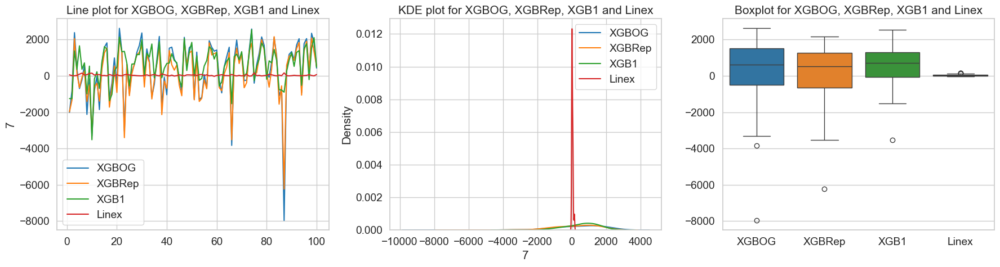

P_value_XGBoostOG 1.619919581736182e-07
P_value_XGBoostRep 2.79800408770409e-06
P_value_XGBoost1 0.0011483800372130287
P_value_Linex 4.2187921758699996e-07
not normal
There is a statistically significant difference
P-Value 4.329897320742365e-09



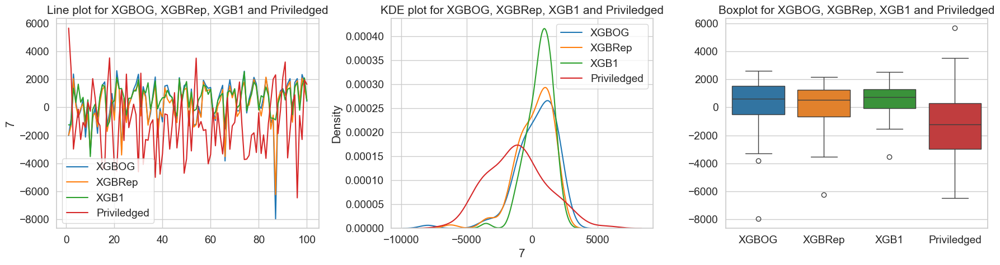

P_value_XGBoostOG 1.619919581736182e-07
P_value_XGBoostRep 2.79800408770409e-06
P_value_XGBoost1 0.0011483800372130287
P_value_Priviledged 0.5018121552779776
not normal
There is a statistically significant difference
P-Value 1.6651766088812615e-11



In [10]:
from scipy.stats import friedmanchisquare
from scipy.stats import wilcoxon
from statsmodels.stats.anova import AnovaRM


xgboostOG_avg_balance = averaged_df.iloc[:, 6]  # XGBoost1 column
xgboostRep_avg_balance = averaged_df.iloc[:, 7]  # XGBoost2 column
xgboost1_avg_balance = averaged_df.iloc[:, 8]  # XGBoost3 column

# Define agent names for easier access and readability
agent_names = [
    "Random",
    "Leader_Wins",
    "Underdog",
    "Back_Favourite",
    "Linex",
    "Priviledged",
]

# Setting style and text scale for seaborn plots
sns.set_style("whitegrid")
sns.set_context(
    "notebook", font_scale=1.25
)  # Adjust the font_scale to increase text size

# Loop through columns 0-5 for other agents
for col_index in range(6):
    other_agent_balance = averaged_df.iloc[:, col_index]
    agent_name = agent_names[col_index]

    # Group the plots horizontally with modified height
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # Decreased the height from 6 to 5

    # Line plot for XGBoost1, XGBoost2, and the other agent
    sns.lineplot(data=xgboostOG_avg_balance, ax=axes[0], label="XGBOG")
    sns.lineplot(data=xgboostRep_avg_balance, ax=axes[0], label="XGBRep")
    sns.lineplot(data=xgboost1_avg_balance, ax=axes[0], label="XGB1")
    sns.lineplot(data=other_agent_balance, ax=axes[0], label=agent_name)
    axes[0].set_title(f"Line plot for XGBOG, XGBRep, XGB1 and {agent_name}")
    axes[0].legend()

    # KDE plot for the distributions
    sns.kdeplot(xgboostOG_avg_balance, ax=axes[1], label="XGBOG")
    sns.kdeplot(xgboostRep_avg_balance, ax=axes[1], label="XGBRep")
    sns.kdeplot(xgboost1_avg_balance, ax=axes[1], label="XGB1")
    sns.kdeplot(other_agent_balance, ax=axes[1], label=agent_name)
    axes[1].set_title(f"KDE plot for XGBOG, XGBRep, XGB1 and {agent_name}")
    axes[1].legend()

    # Boxplot for the three distributions
    combined_data = pd.concat(
        [
            xgboostOG_avg_balance.rename("XGBOG"),
            xgboostRep_avg_balance.rename("XGBRep"),
            xgboost1_avg_balance.rename("XGB1"),
            other_agent_balance.rename(agent_name),
        ],
        axis=1,
    )
    sns.boxplot(data=combined_data, ax=axes[2])
    axes[2].set_title(f"Boxplot for XGBOG, XGBRep, XGB1 and {agent_name}")

    plt.tight_layout()
    plt.show()

    # Check normality for all three columns
    _, pvalue_xgboostOG = stats.shapiro(xgboostOG_avg_balance)
    _, pvalue_xgboostRep = stats.shapiro(xgboostRep_avg_balance)
    _, pvalue_xgboost1 = stats.shapiro(xgboost1_avg_balance)
    _, pvalue_other_agent = stats.shapiro(other_agent_balance)
    print(f"P_value_XGBoostOG", pvalue_xgboostOG)
    print(f"P_value_XGBoostRep", pvalue_xgboostRep)
    print(f"P_value_XGBoost1", pvalue_xgboost1)
    print(f"P_value_{agent_name}", pvalue_other_agent)

    # If all are normally distributed
    if (
        pvalue_xgboostOG > 0.05
        and pvalue_xgboostRep > 0.05
        and pvalue_xgboost1 > 0.05
        and pvalue_other_agent > 0.05
    ):
        print("normal")
        # Prepare data for repeated measures ANOVA
        data = pd.concat(
            [
                xgboostOG_avg_balance,
                xgboostRep_avg_balance,
                xgboost1_avg_balance,
                other_agent_balance,
            ],
            axis=1,
        )
        data = data.melt(var_name="group", value_name="value")
        data["id"] = data.index
        # Perform repeated measures ANOVA
        model = AnovaRM(data, "value", "id", within=["group"])
        res = model.fit()
        print(res)
    else:
        print("not normal")
        # If either or both are not normally distributed
        statistic, pvalue = friedmanchisquare(
            xgboostOG_avg_balance,
            xgboostRep_avg_balance,
            xgboost1_avg_balance,
            other_agent_balance,
        )
        if pvalue < 0.05:
            print("There is a statistically significant difference")
            print("P-Value", pvalue)
            print("")
        else:
            print("There isn't a statistically significant difference")

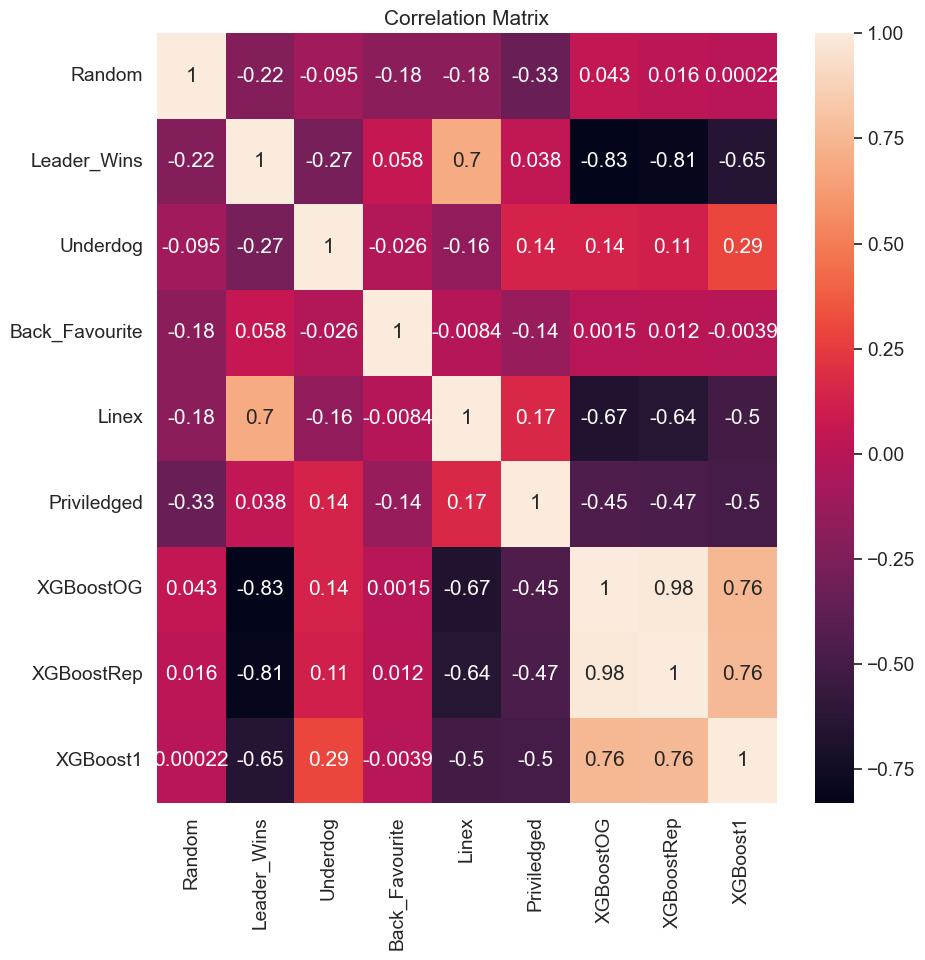

1     -50.218769
2     241.251375
3     -20.243927
4    -214.373696
5      41.205870
6   -1148.776395
7     362.474765
8     192.742030
9     598.317893
dtype: float64


In [34]:
agent_names = [
    "Random",
    "Leader_Wins",
    "Underdog",
    "Back_Favourite",
    "Linex",
    "Priviledged",
    "XGBoostOG",
    "XGBoostRep",
    "XGBoost1",
]

# Create a new figure with a specified size (width, height)
plt.figure(figsize=(10, 10))

# Compute correlation matrix
correlation_matrix = averaged_df.corr()

# Set index and columns to agent names
correlation_matrix.index = agent_names
correlation_matrix.columns = agent_names

# Plot heatmap
sns.heatmap(
    correlation_matrix,
    annot=True,
)  # cmap="coolwarm_r"

# Set title
plt.title("Correlation Matrix")

# Show the plot
plt.show()

mean_balances = averaged_df.mean()
print(mean_balances)

Pairwise correlation matrix: This can help you understand the relationship between different agents. If two agents have a high positive correlation, it means they tend to have high balances at the same time. If they have a high negative correlation, it means when one has a high balance, the other tends to have a low balance.

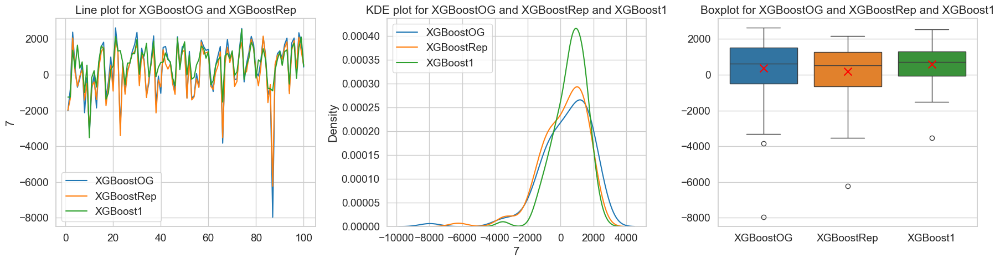

P_value_XGBoost1 1.619919581736182e-07
P_value_XGBoost2 2.79800408770409e-06
P_value_XGBoost3 0.0011483800372130287
not normal
There is a statistically significant difference
P-Value 3.097764567011367e-08

XGBoostOG     362.474765
XGBoostRep    192.742030
XGBoost1      598.317893
dtype: float64
XGBoostOG     629.508541
XGBoostRep    517.919199
XGBoost1      717.432043
dtype: float64


In [36]:
import scikit_posthocs as sp


xgboostOG_avg_balance = averaged_df.iloc[:, 6]  # XGBoost1 column
xgboostRep_avg_balance = averaged_df.iloc[:, 7]  # XGBoost2 column
xgboost1_avg_balance = averaged_df.iloc[:, 8]  # XGBoost3 column

# Setting style and text scale for seaborn plots
sns.set_style("whitegrid")
sns.set_context(
    "notebook", font_scale=1.25
)  # Adjust the font_scale to increase text size

# Group the plots horizontally with modified height
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # Decreased the height from 6 to 5

# Line plot for XGBoost1 and XGBoost2
sns.lineplot(data=xgboostOG_avg_balance, ax=axes[0], label="XGBoostOG")
sns.lineplot(data=xgboostRep_avg_balance, ax=axes[0], label="XGBoostRep")
sns.lineplot(data=xgboost1_avg_balance, ax=axes[0], label="XGBoost1")
axes[0].set_title("Line plot for XGBoostOG and XGBoostRep")
axes[0].legend()

# KDE plot for the distributions
sns.kdeplot(xgboostOG_avg_balance, ax=axes[1], label="XGBoostOG")
sns.kdeplot(xgboostRep_avg_balance, ax=axes[1], label="XGBoostRep")
sns.kdeplot(xgboost1_avg_balance, ax=axes[1], label="XGBoost1")
axes[1].set_title("KDE plot for XGBoostOG and XGBoostRep and XGBoost1")
axes[1].legend()

# # Boxplot for the two distributions
# combined_data = pd.concat(
#     [xgboost1_avg_balance.rename("XGBoost1"), xgboost2_avg_balance.rename("XGBoost2")],
#     axis=1,
# )
# sns.boxplot(data=combined_data, ax=axes[2])
# axes[2].set_title("Boxplot for XGBoost1 and XGBoost2")

# Boxplot for the two distributions
combined_data = pd.concat(
    [
        xgboostOG_avg_balance.rename("XGBoostOG"),
        xgboostRep_avg_balance.rename("XGBoostRep"),
        xgboost1_avg_balance.rename("XGBoost1"),
    ],
    axis=1,
)
sns.boxplot(data=combined_data, ax=axes[2])

# Calculate the means
means = combined_data.mean()
median = combined_data.median() 

# Add a black 'x' for the mean of each distribution
for i, mean in enumerate(means):
    axes[2].scatter(
        i, mean, marker="x", color="red", s=100, zorder=3
    )  # s parameter is for size of 'x', zorder=3 ensures the marker is drawn on top

axes[2].set_title("Boxplot for XGBoostOG and XGBoostRep and XGBoost1")

plt.tight_layout()
plt.show()

# Check normality for all three columns
_, pvalue_xgboostOG = stats.shapiro(xgboostOG_avg_balance)
_, pvalue_xgboostRep = stats.shapiro(xgboostRep_avg_balance)
_, pvalue_xgboost1 = stats.shapiro(xgboost1_avg_balance)
print("P_value_XGBoost1", pvalue_xgboostOG)
print("P_value_XGBoost2", pvalue_xgboostRep)
print("P_value_XGBoost3", pvalue_xgboost1)

# If all are normally distributed
if pvalue_xgboostOG > 0.05 and pvalue_xgboostRep > 0.05 and pvalue_xgboost1 > 0.05:
    print("normal")
    # Prepare data for repeated measures ANOVA
    data = pd.concat(
        [xgboostOG_avg_balance, xgboostRep_avg_balance, xgboost1_avg_balance], axis=1
    )
    data = data.melt(var_name="group", value_name="value")
    data["id"] = data.index
    # Perform repeated measures ANOVA
    model = AnovaRM(data, "value", "id", within=["group"])
    res = model.fit()
    print(res)
else:
    print("not normal")
    # If either or all are not normally distributed
    statistic, pvalue = friedmanchisquare(
        xgboostOG_avg_balance, xgboostRep_avg_balance, xgboost1_avg_balance
    )
    if pvalue < 0.05:
        print("There is a statistically significant difference")
        print("P-Value", pvalue)
        print("")
    else:
        print("There isn't a statistically significant difference")

print(means)
print(median)

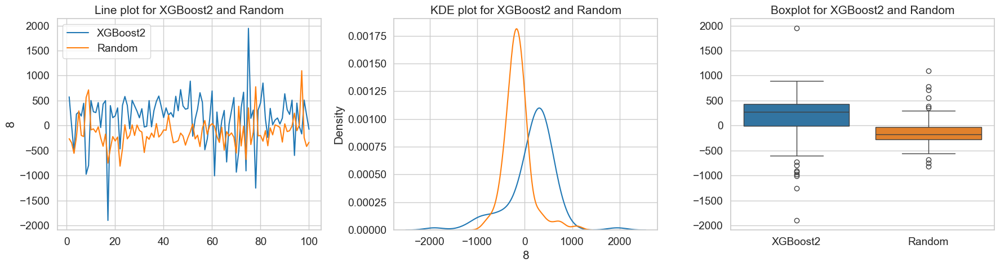

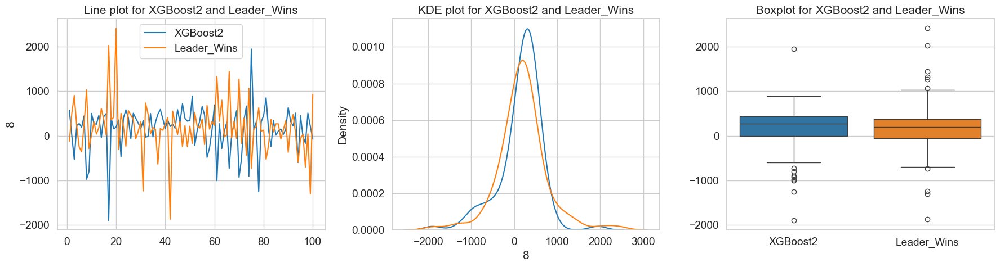

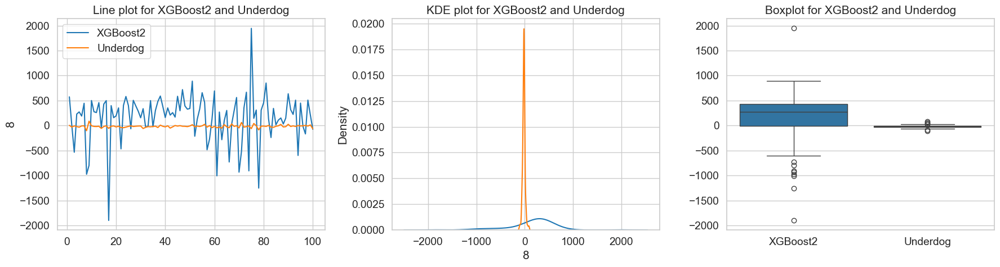

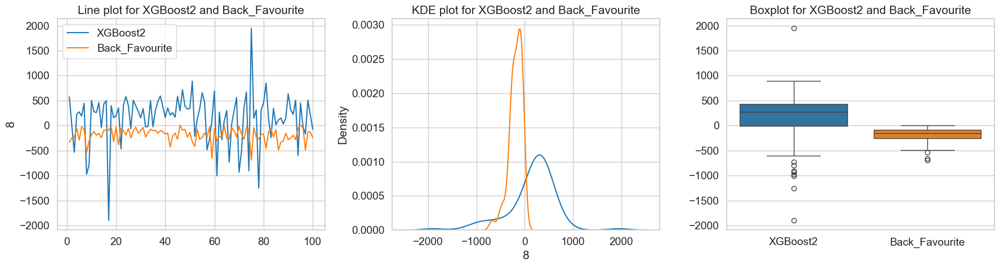

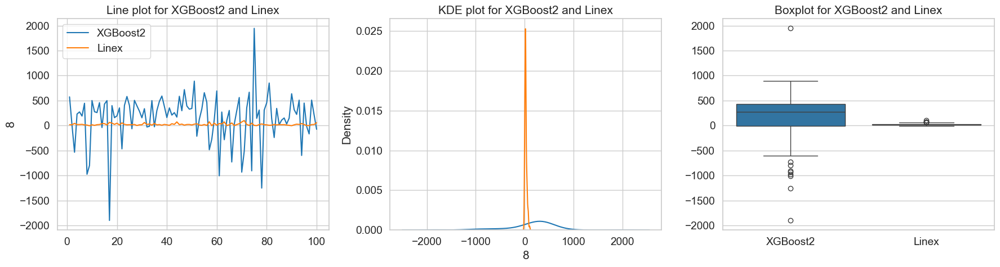

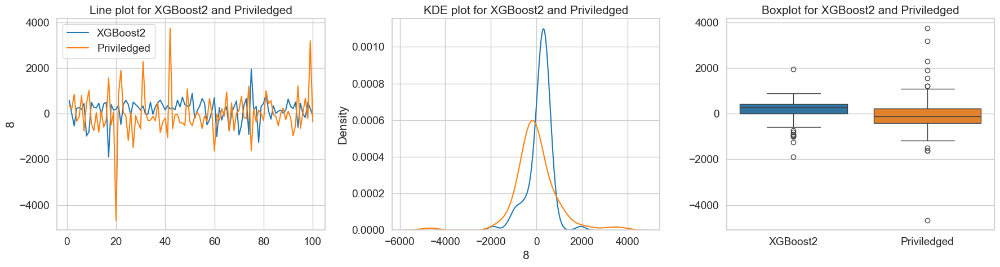

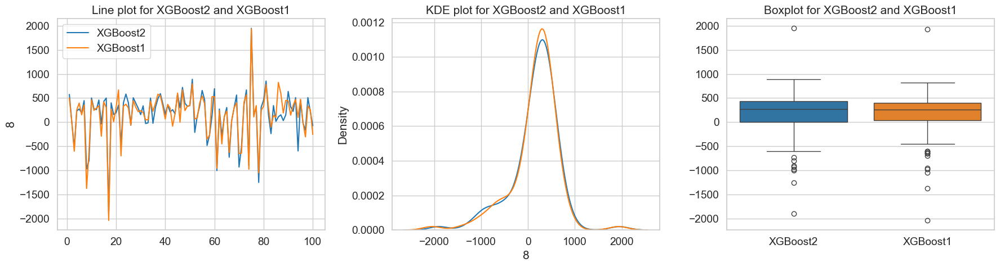

In [18]:
xgboost2_avg_balance = averaged_df.iloc[:, 7]  # XGBoost column

# Define agent names for easier access and readability
agent_names = ["Random", "Leader_Wins", "Underdog", "Back_Favourite", "Linex", "Priviledged", "XGBoost1"]

# Setting style and text scale for seaborn plots
sns.set_style("whitegrid")
sns.set_context("notebook", font_scale=1.25)  # Adjust the font_scale to increase text size

# Loop through columns 1-7 for other agents
for col_index in range(7):
    other_agent_balance = averaged_df.iloc[:, col_index]
    agent_name = agent_names[col_index]

    # Group the plots horizontally with modified height
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # Decreased the height from 6 to 5

    # Line plot for XGBoost and the other agent
    sns.lineplot(data=xgboost2_avg_balance, ax=axes[0], label='XGBoost2')
    sns.lineplot(data=other_agent_balance, ax=axes[0], label=agent_name)
    axes[0].set_title(f'Line plot for XGBoost2 and {agent_name}')

    # KDE plot for the distributions
    sns.kdeplot(xgboost2_avg_balance, ax=axes[1], label='XGBoost2')
    sns.kdeplot(other_agent_balance, ax=axes[1], label=agent_name)
    axes[1].set_title(f'KDE plot for XGBoost2 and {agent_name}')

    # Boxplot for the two distributions
    combined_data = pd.concat([xgboost2_avg_balance.rename('XGBoost2'), 
                               other_agent_balance.rename(agent_name)], axis=1)
    sns.boxplot(data=combined_data, ax=axes[2])
    axes[2].set_title(f'Boxplot for XGBoost2 and {agent_name}')
    
    plt.tight_layout()
    plt.show()